# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle
import random
from random import sample

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter

#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import Conditional_VAE as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

## load config and set logger

In [4]:
log_file = config['IO_OPTION']['OUTPUT_ROOT']+'/train_{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_file, '00_train.py')

## Setting

In [5]:
# Setting seed
modeler.set_seed(777)

In [6]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
#dev_dir = INPUT_ROOT + "/dev_data"
#add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = ['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
OUT_SCORE_DIR = OUTPUT_ROOT + '/score'
OUT_PRED_DIR = OUTPUT_ROOT + '/pred'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
os.makedirs(OUT_SCORE_DIR, exist_ok=True)
os.makedirs(OUT_PRED_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/dcase2021_task2/output/CenterLossVAE/ex17/config.yaml'

In [7]:
torch.cuda.is_available()

True

In [8]:
#ext_data = pd.read_pickle(f'{INPUT_ROOT}/valve_features.pkl')

In [9]:
#sns.distplot(ext_data['train']['features'][:,0])

In [10]:
#train_features = ext_data['train']['features']

In [11]:
#train_features.shape

## training

In [12]:
def random_feature_selection(x, t_d=3776, d=2048):
    idx = torch.tensor(sample(range(0, t_d), d)) # t_d(特徴量)の中からランダムにd個サンプリングする(ぜんぶやると重いから) # わからん
    # 0~t_d idxの中からランダムにd個サンプリングする
    x = np.take(x, idx, 1)
    return x

In [13]:
#ext_data['train'].keys()

In [14]:
#############################################################################
# run
#############################################################################
def run(machine_type):
    com.tic()
    logger.info('TARGET MACHINE_TYPE: {0}'.format(machine_type))
    logger.info('MAKE DATA_LOADER')
    # dataloader
    #for machine in machine_types:
    #    if machine_type == machine:
    ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine_type}_features.pkl')
    
    #    else:
    #        ext_data_ = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #        ext_data['train']['features'] = np.concatenate([ext_data['train']['features'],
    #                                                        ext_data_['train']['features']], axis=0)
    #        ext_data['train']['labels'] = np.concatenate([ext_data['train']['labels'],
    #                                                     ext_data_['train']['labels']], axis=0)
    #        ext_data['train']['wav_names'] = np.concatenate([ext_data['train']['wav_names'],
    #                                                         ext_data_['train']['wav_names']], axis=0)
            
    #t_d = 3776    # 全特徴量数
    #d = 1024      # 使う特徴量数
    #for phase in ['train', 'valid_source', 'valid_target']:
    #    x = ext_data[phase]['features']
    #    x = random_feature_selection(x)
    #    ext_data[phase]['features'] = x
    #    x = ext_data[phase]['features'][:,512:2048]
    #    ext_data[phase]['features'] = x
    dataloaders_dict = modeler.make_dataloader(ext_data)
    # define writer for tensorbord
    os.makedirs(TB_DIR+'/'+machine_type, exist_ok=True)
    tb_log_dir = TB_DIR + '/' + machine_type
    writer = SummaryWriter(log_dir = tb_log_dir)
    # out path
    model_out_path = MODEL_DIR+'/{}_model.pth'.format(machine_type)
    score_out_path = OUT_SCORE_DIR + '/{}_score.csv'.format(machine_type)
    pred_out_path = OUT_PRED_DIR + '/{}_pred.csv'.format(machine_type)
    logger.info('TRAINING')
    # parameter setting
    in_features = ext_data['train']['features'].shape[1]
    mid_size = config['param']['mid_size']
    latent_size = config['param']['latent_size']
    num_classes = 6
    net = Model(in_features, mid_size, latent_size, num_classes)
    optimizer = optim.Adam(net.parameters(), lr=1e-4)
    num_epochs = config['param']['num_epochs']
    #scheduler = optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e-2, 
    #                                          max_lr=1e-3, epochs=num_epochs, steps_per_epoch=len(dataloaders_dict['train']))
    # training
    output_dicts = modeler.train_net(net, dataloaders_dict, optimizer, num_epochs, writer, model_out_path, score_out_path, pred_out_path)
    
    com.toc()

In [15]:
machine_types

['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']

2021-05-30 22:44:19,226 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-05-30 22:44:19,227 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 22:44:20,238 - 00_train.py - INFO - TRAINING
2021-05-30 22:44:24,512 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:01<00:00,  9.03it/s]
2021-05-30 22:44:25,844 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.01it/s]
2021-05-30 22:44:25,915 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.47it/s]


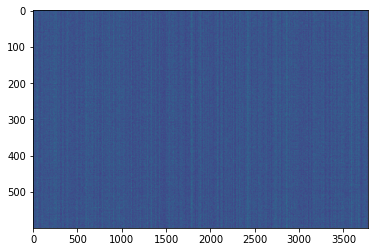

,AUC,pAUC
Source_0,0.463000,0.487368
Source_1,0.511200,0.486316
Source_2,0.587400,0.521053
Target_0,0.403100,0.494211
Target_1,0.442400,0.493158
Target_2,0.441400,0.485263
mean,0.474750,0.494561
h_mean,0.467832,0.494266


2021-05-30 22:44:27,787 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:848.179738, val_AUC_hmean:0.467832, val_pAUC_hmean:0.494266, best_flag:True
2021-05-30 22:44:27,788 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.93it/s]
2021-05-30 22:44:28,593 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.40it/s]
2021-05-30 22:44:28,645 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.67it/s]


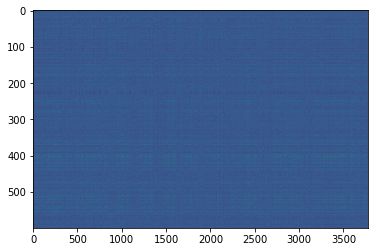

,AUC,pAUC
Source_0,0.753600,0.627895
Source_1,0.645900,0.516316
Source_2,0.743700,0.592632
Target_0,0.675000,0.641053
Target_1,0.828600,0.670526
Target_2,0.591000,0.517368
mean,0.706300,0.594298
h_mean,0.697658,0.588179


2021-05-30 22:44:30,331 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:556.746503, val_AUC_hmean:0.697658, val_pAUC_hmean:0.588179, best_flag:True
2021-05-30 22:44:30,332 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.64it/s]
2021-05-30 22:44:31,055 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.55it/s]
2021-05-30 22:44:31,126 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.92it/s]
2021-05-30 22:44:31,197 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:444.752027, val_AUC_hmean:0.660002, val_pAUC_hmean:0.563520, best_flag:False
2021-05-30 22:44:31,200 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.79it/s]
2021-05-30 22:44:31,962 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.71it/s]
2021-05-30 22:44:32,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.98it/s]
2021-05-30 22:44:32

100%|██████████| 2/2 [00:00<00:00, 47.02it/s]
2021-05-30 22:44:45,291 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.13it/s]
2021-05-30 22:44:45,373 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:275.266864, val_AUC_hmean:0.602271, val_pAUC_hmean:0.557156, best_flag:False
2021-05-30 22:44:45,375 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.65it/s]
2021-05-30 22:44:46,099 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.18it/s]
2021-05-30 22:44:46,152 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.70it/s]
2021-05-30 22:44:46,205 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:270.270017, val_AUC_hmean:0.623240, val_pAUC_hmean:0.543320, best_flag:False
2021-05-30 22:44:46,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.14it/s]
2021-05-30 22:44:46,951 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 16.79it/s]
2021-05-30 22:45:00,215 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.27it/s]
2021-05-30 22:45:00,270 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.28it/s]
2021-05-30 22:45:00,325 - pytorch_modeler.py - INFO - epoch:36/300, train_losses:232.830424, val_AUC_hmean:0.628756, val_pAUC_hmean:0.549248, best_flag:False
2021-05-30 22:45:00,327 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.10it/s]
2021-05-30 22:45:00,958 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.41it/s]
2021-05-30 22:45:01,003 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.66it/s]
2021-05-30 22:45:01,059 - pytorch_modeler.py - INFO - epoch:37/300, train_losses:230.253352, val_AUC_hmean:0.630194, val_pAUC_hmean:0.549040, best_flag:False
2021-05-30 22:45:01,060 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:45:13,457 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.58it/s]
2021-05-30 22:45:14,183 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.58it/s]
2021-05-30 22:45:14,237 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.38it/s]
2021-05-30 22:45:14,310 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:201.650206, val_AUC_hmean:0.604375, val_pAUC_hmean:0.541640, best_flag:False
2021-05-30 22:45:14,311 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.68it/s]
2021-05-30 22:45:15,032 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.28it/s]
2021-05-30 22:45:15,078 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.80it/s]
2021-05-30 22:45:15,138 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:199.315122, val_AUC_hmean:0.591994, val_pAUC_hmean:0.547656, best_flag:False
2021-05-30 22:45

100%|██████████| 2/2 [00:00<00:00, 62.59it/s]
2021-05-30 22:45:27,982 - pytorch_modeler.py - INFO - epoch:69/300, train_losses:178.515310, val_AUC_hmean:0.576974, val_pAUC_hmean:0.541769, best_flag:False
2021-05-30 22:45:27,983 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.20it/s]
2021-05-30 22:45:28,644 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 89.54it/s]
2021-05-30 22:45:28,686 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.54it/s]
2021-05-30 22:45:28,729 - pytorch_modeler.py - INFO - epoch:70/300, train_losses:176.867161, val_AUC_hmean:0.574800, val_pAUC_hmean:0.546903, best_flag:False
2021-05-30 22:45:28,730 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.03it/s]
2021-05-30 22:45:29,211 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.28it/s]
2021-05-30 22:45:29,256 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 2/2 [00:00<00:00, 56.16it/s]
2021-05-30 22:45:41,490 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.83it/s]
2021-05-30 22:45:41,554 - pytorch_modeler.py - INFO - epoch:86/300, train_losses:156.050654, val_AUC_hmean:0.554413, val_pAUC_hmean:0.529871, best_flag:False
2021-05-30 22:45:41,555 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.54it/s]
2021-05-30 22:45:42,283 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.08it/s]
2021-05-30 22:45:42,332 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.75it/s]
2021-05-30 22:45:42,390 - pytorch_modeler.py - INFO - epoch:87/300, train_losses:154.280421, val_AUC_hmean:0.548720, val_pAUC_hmean:0.540781, best_flag:False
2021-05-30 22:45:42,391 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.78it/s]
2021-05-30 22:45:43,068 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 22.91it/s]
2021-05-30 22:45:54,909 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.32it/s]
2021-05-30 22:45:54,953 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.30it/s]
2021-05-30 22:45:55,006 - pytorch_modeler.py - INFO - epoch:103/300, train_losses:135.994901, val_AUC_hmean:0.570103, val_pAUC_hmean:0.537431, best_flag:False
2021-05-30 22:45:55,007 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 24.48it/s]
2021-05-30 22:45:55,500 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.23it/s]
2021-05-30 22:45:55,544 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.84it/s]
2021-05-30 22:45:55,589 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:135.782304, val_AUC_hmean:0.553994, val_pAUC_hmean:0.544967, best_flag:False
2021-05-30 22:45:55,590 - pytorch_modeler.py - INFO - train
100%|█████████

2021-05-30 22:46:08,031 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.47it/s]
2021-05-30 22:46:08,762 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.93it/s]
2021-05-30 22:46:08,827 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.05it/s]
2021-05-30 22:46:08,883 - pytorch_modeler.py - INFO - epoch:120/300, train_losses:120.804384, val_AUC_hmean:0.521000, val_pAUC_hmean:0.529950, best_flag:False
2021-05-30 22:46:08,884 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.50it/s]
2021-05-30 22:46:09,613 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.47it/s]
2021-05-30 22:46:09,673 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.43it/s]
2021-05-30 22:46:09,728 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:120.148290, val_AUC_hmean:0.526003, val_pAUC_hmean:0.522330, best_flag:False
2021-05-30 22:

100%|██████████| 2/2 [00:00<00:00, 73.38it/s]
2021-05-30 22:46:22,681 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:105.611588, val_AUC_hmean:0.568245, val_pAUC_hmean:0.538490, best_flag:False
2021-05-30 22:46:22,682 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.97it/s]
2021-05-30 22:46:23,435 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.10it/s]
2021-05-30 22:46:23,481 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.23it/s]
2021-05-30 22:46:23,540 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:104.137016, val_AUC_hmean:0.542157, val_pAUC_hmean:0.525117, best_flag:False
2021-05-30 22:46:23,542 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.02it/s]
2021-05-30 22:46:24,248 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.76it/s]
2021-05-30 22:46:24,304 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 2/2 [00:00<00:00, 71.40it/s]
2021-05-30 22:46:37,043 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.60it/s]
2021-05-30 22:46:37,092 - pytorch_modeler.py - INFO - epoch:153/300, train_losses:90.604871, val_AUC_hmean:0.541670, val_pAUC_hmean:0.554653, best_flag:False
2021-05-30 22:46:37,093 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.00it/s]
2021-05-30 22:46:37,845 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.22it/s]
2021-05-30 22:46:37,907 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.22it/s]
2021-05-30 22:46:37,960 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:90.029028, val_AUC_hmean:0.563859, val_pAUC_hmean:0.538019, best_flag:False
2021-05-30 22:46:37,961 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.00it/s]
2021-05-30 22:46:38,713 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 23.20it/s]
2021-05-30 22:46:50,862 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.51it/s]
2021-05-30 22:46:50,917 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.09it/s]
2021-05-30 22:46:50,980 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:77.659188, val_AUC_hmean:0.524132, val_pAUC_hmean:0.532448, best_flag:False
2021-05-30 22:46:50,981 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.62it/s]
2021-05-30 22:46:51,706 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.09it/s]
2021-05-30 22:46:51,769 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.90it/s]
2021-05-30 22:46:51,826 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:77.611459, val_AUC_hmean:0.545265, val_pAUC_hmean:0.529996, best_flag:False
2021-05-30 22:46:51,827 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:47:03,161 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.89it/s]
2021-05-30 22:47:03,873 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.72it/s]
2021-05-30 22:47:03,937 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.21it/s]
2021-05-30 22:47:03,996 - pytorch_modeler.py - INFO - epoch:187/300, train_losses:66.664820, val_AUC_hmean:0.534244, val_pAUC_hmean:0.519468, best_flag:False
2021-05-30 22:47:03,997 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.88it/s]
2021-05-30 22:47:04,710 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.97it/s]
2021-05-30 22:47:04,773 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.17it/s]
2021-05-30 22:47:04,831 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:65.815841, val_AUC_hmean:0.542079, val_pAUC_hmean:0.533167, best_flag:False
2021-05-30 22:47

100%|██████████| 2/2 [00:00<00:00, 60.10it/s]
2021-05-30 22:47:16,104 - pytorch_modeler.py - INFO - epoch:203/300, train_losses:57.438919, val_AUC_hmean:0.545347, val_pAUC_hmean:0.529770, best_flag:False
2021-05-30 22:47:16,106 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.87it/s]
2021-05-30 22:47:16,819 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.08it/s]
2021-05-30 22:47:16,885 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.36it/s]
2021-05-30 22:47:16,944 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:56.857200, val_AUC_hmean:0.542245, val_pAUC_hmean:0.517650, best_flag:False
2021-05-30 22:47:16,945 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.91it/s]
2021-05-30 22:47:17,657 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.08it/s]
2021-05-30 22:47:17,717 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 2/2 [00:00<00:00, 77.28it/s]
2021-05-30 22:47:30,059 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.68it/s]
2021-05-30 22:47:30,111 - pytorch_modeler.py - INFO - epoch:220/300, train_losses:60.121505, val_AUC_hmean:0.538693, val_pAUC_hmean:0.536937, best_flag:False
2021-05-30 22:47:30,113 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 24.83it/s]
2021-05-30 22:47:30,597 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.96it/s]
2021-05-30 22:47:30,643 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.37it/s]
2021-05-30 22:47:30,701 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:58.174902, val_AUC_hmean:0.482433, val_pAUC_hmean:0.518229, best_flag:False
2021-05-30 22:47:30,703 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.83it/s]
2021-05-30 22:47:31,342 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 16.81it/s]
2021-05-30 22:47:44,099 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.08it/s]
2021-05-30 22:47:44,153 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.76it/s]
2021-05-30 22:47:44,205 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:40.936256, val_AUC_hmean:0.536424, val_pAUC_hmean:0.542979, best_flag:False
2021-05-30 22:47:44,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.92it/s]
2021-05-30 22:47:44,918 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.89it/s]
2021-05-30 22:47:44,978 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.80it/s]
2021-05-30 22:47:45,042 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:40.088671, val_AUC_hmean:0.533661, val_pAUC_hmean:0.529634, best_flag:False
2021-05-30 22:47:45,044 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:47:55,921 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.86it/s]
2021-05-30 22:47:56,635 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.33it/s]
2021-05-30 22:47:56,681 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.77it/s]
2021-05-30 22:47:56,727 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:33.766737, val_AUC_hmean:0.536223, val_pAUC_hmean:0.535540, best_flag:False
2021-05-30 22:47:56,728 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.27it/s]
2021-05-30 22:47:57,205 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.88it/s]
2021-05-30 22:47:57,249 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.61it/s]
2021-05-30 22:47:57,297 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:33.477138, val_AUC_hmean:0.550974, val_pAUC_hmean:0.536001, best_flag:False
2021-05-30 22:47

100%|██████████| 2/2 [00:00<00:00, 85.97it/s]
2021-05-30 22:48:07,777 - pytorch_modeler.py - INFO - epoch:270/300, train_losses:28.578670, val_AUC_hmean:0.547903, val_pAUC_hmean:0.528990, best_flag:False
2021-05-30 22:48:07,778 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 21.70it/s]
2021-05-30 22:48:08,333 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.64it/s]
2021-05-30 22:48:08,407 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.42it/s]
2021-05-30 22:48:08,465 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:28.254143, val_AUC_hmean:0.544812, val_pAUC_hmean:0.524130, best_flag:False
2021-05-30 22:48:08,466 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.75it/s]
2021-05-30 22:48:09,186 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.49it/s]
2021-05-30 22:48:09,249 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 2/2 [00:00<00:00, 53.74it/s]
2021-05-30 22:48:20,447 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.16it/s]
2021-05-30 22:48:20,507 - pytorch_modeler.py - INFO - epoch:287/300, train_losses:23.671421, val_AUC_hmean:0.559322, val_pAUC_hmean:0.529438, best_flag:False
2021-05-30 22:48:20,508 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.91it/s]
2021-05-30 22:48:21,033 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.47it/s]
2021-05-30 22:48:21,077 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.33it/s]
2021-05-30 22:48:21,127 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:23.449369, val_AUC_hmean:0.547010, val_pAUC_hmean:0.528519, best_flag:False
2021-05-30 22:48:21,128 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 24.88it/s]
2021-05-30 22:48:21,612 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

,AUC,pAUC
Source_0,0.753600,0.627895
Source_1,0.645900,0.516316
Source_2,0.743700,0.592632
Target_0,0.675000,0.641053
Target_1,0.828600,0.670526
Target_2,0.591000,0.517368
mean,0.706300,0.594298
h_mean,0.697658,0.588179


2021-05-30 22:48:30,866 - 00_train.py - INFO - TARGET MACHINE_TYPE: gearbox
2021-05-30 22:48:30,867 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 22:48:30,933 - 00_train.py - INFO - TRAINING


elapsed time: 251.639267206 [sec]


2021-05-30 22:48:31,344 - pytorch_modeler.py - INFO - train
 25%|██▌       | 3/12 [00:00<00:00, 25.44it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 25.21it/s]
2021-05-30 22:48:31,823 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.43it/s]
2021-05-30 22:48:31,928 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.67it/s]


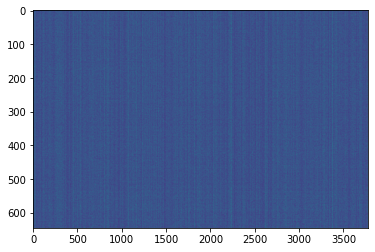

,AUC,pAUC
Source_0,0.437949,0.485123
Source_1,0.239540,0.481175
Source_2,0.319646,0.481524
Target_0,0.247975,0.479167
Target_1,0.175669,0.473684
Target_2,0.289127,0.475982
mean,0.284984,0.479442
h_mean,0.263500,0.479413


2021-05-30 22:48:33,582 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:956.501536, val_AUC_hmean:0.263500, val_pAUC_hmean:0.479413, best_flag:True
2021-05-30 22:48:33,584 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.06it/s]
2021-05-30 22:48:34,333 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.24it/s]
2021-05-30 22:48:34,387 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.77it/s]


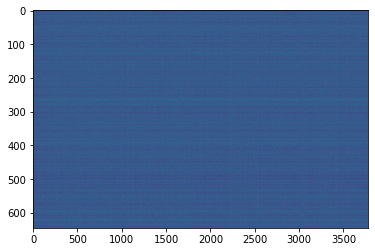

,AUC,pAUC
Source_0,0.545934,0.534220
Source_1,0.873971,0.749747
Source_2,0.784420,0.620942
Target_0,0.810860,0.651864
Target_1,0.888032,0.768699
Target_2,0.762778,0.611529
mean,0.777666,0.656167
h_mean,0.757471,0.646111


2021-05-30 22:48:36,092 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:707.211268, val_AUC_hmean:0.757471, val_pAUC_hmean:0.646111, best_flag:True
2021-05-30 22:48:36,093 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.92it/s]
2021-05-30 22:48:36,849 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.77it/s]
2021-05-30 22:48:36,909 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.62it/s]
2021-05-30 22:48:36,965 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:604.547938, val_AUC_hmean:0.700501, val_pAUC_hmean:0.565180, best_flag:False
2021-05-30 22:48:36,967 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.77it/s]
2021-05-30 22:48:37,730 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.83it/s]
2021-05-30 22:48:37,789 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.77it/s]
2021-05-30 22:48:37

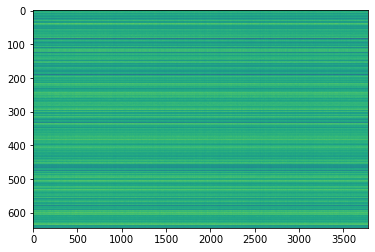

,AUC,pAUC
Source_0,0.549060,0.587302
Source_1,0.853138,0.717800
Source_2,0.762144,0.644461
Target_0,0.830536,0.816541
Target_1,0.882802,0.771677
Target_2,0.763651,0.699875
mean,0.773555,0.706276
h_mean,0.754544,0.697925


2021-05-30 22:48:41,125 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:468.051783, val_AUC_hmean:0.754544, val_pAUC_hmean:0.697925, best_flag:True
2021-05-30 22:48:41,126 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.67it/s]
2021-05-30 22:48:41,848 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.08it/s]
2021-05-30 22:48:41,914 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.57it/s]
2021-05-30 22:48:41,971 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:441.064166, val_AUC_hmean:0.737191, val_pAUC_hmean:0.694551, best_flag:False
2021-05-30 22:48:41,972 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.59it/s]
2021-05-30 22:48:42,697 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.10it/s]
2021-05-30 22:48:42,762 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.59it/s]
2021-05-30 22:48:42

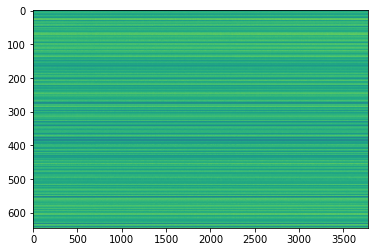

,AUC,pAUC
Source_0,0.654212,0.588715
Source_1,0.932870,0.799112
Source_2,0.742150,0.663036
Target_0,0.875579,0.809028
Target_1,0.903892,0.783770
Target_2,0.788810,0.676274
mean,0.816252,0.719989
h_mean,0.803846,0.710157


2021-05-30 22:48:46,861 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:385.140172, val_AUC_hmean:0.803846, val_pAUC_hmean:0.710157, best_flag:True
2021-05-30 22:48:46,861 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.29it/s]
2021-05-30 22:48:47,600 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.78it/s]
2021-05-30 22:48:47,663 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.83it/s]
2021-05-30 22:48:47,722 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:375.221080, val_AUC_hmean:0.798558, val_pAUC_hmean:0.705514, best_flag:False
2021-05-30 22:48:47,723 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.07it/s]
2021-05-30 22:48:48,389 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.66it/s]
2021-05-30 22:48:48,441 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.46it/s]


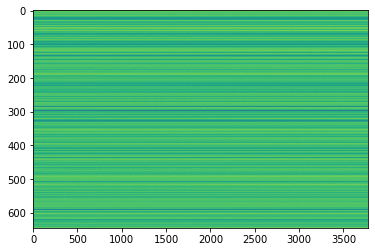

,AUC,pAUC
Source_0,0.625006,0.576120
Source_1,0.944959,0.810032
Source_2,0.748725,0.659788
Target_0,0.841532,0.794814
Target_1,0.935614,0.814273
Target_2,0.777381,0.684837
mean,0.812203,0.723311
h_mean,0.796038,0.711545


2021-05-30 22:48:50,001 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:366.965825, val_AUC_hmean:0.796038, val_pAUC_hmean:0.711545, best_flag:True
2021-05-30 22:48:50,002 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.12it/s]
2021-05-30 22:48:50,748 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 11.68it/s]
2021-05-30 22:48:50,946 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.62it/s]


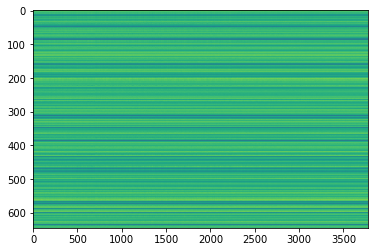

,AUC,pAUC
Source_0,0.630037,0.560440
Source_1,0.945730,0.810483
Source_2,0.762144,0.668051
Target_0,0.877411,0.819790
Target_1,0.914266,0.794509
Target_2,0.800238,0.723058
mean,0.821638,0.729388
h_mean,0.806473,0.716288


2021-05-30 22:48:52,492 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:356.500371, val_AUC_hmean:0.806473, val_pAUC_hmean:0.716288, best_flag:True
2021-05-30 22:48:52,493 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.10it/s]
2021-05-30 22:48:53,239 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.95it/s]
2021-05-30 22:48:53,306 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.30it/s]
2021-05-30 22:48:53,364 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:351.007929, val_AUC_hmean:0.802041, val_pAUC_hmean:0.685581, best_flag:False
2021-05-30 22:48:53,365 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.87it/s]
2021-05-30 22:48:54,123 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.22it/s]
2021-05-30 22:48:54,179 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.47it/s]


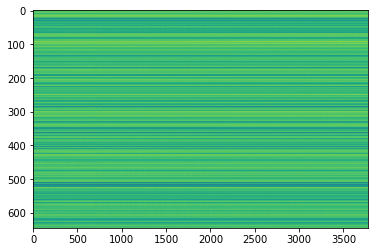

,AUC,pAUC
Source_0,0.692259,0.595656
Source_1,0.953447,0.847394
Source_2,0.788983,0.690228
Target_0,0.898341,0.842836
Target_1,0.941358,0.807054
Target_2,0.817143,0.710317
mean,0.848588,0.748914
h_mean,0.837982,0.737004


2021-05-30 22:48:55,798 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:343.862925, val_AUC_hmean:0.837982, val_pAUC_hmean:0.737004, best_flag:True
2021-05-30 22:48:55,799 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.23it/s]
2021-05-30 22:48:56,541 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.60it/s]
2021-05-30 22:48:56,612 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.32it/s]
2021-05-30 22:48:56,682 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:335.413691, val_AUC_hmean:0.782163, val_pAUC_hmean:0.651276, best_flag:False
2021-05-30 22:48:56,684 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.33it/s]
2021-05-30 22:48:57,424 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.33it/s]
2021-05-30 22:48:57,482 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.12it/s]
2021-05-30 22:48:

100%|██████████| 2/2 [00:00<00:00, 69.98it/s]
2021-05-30 22:49:10,535 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.29it/s]
2021-05-30 22:49:10,588 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:269.829793, val_AUC_hmean:0.796845, val_pAUC_hmean:0.700953, best_flag:False
2021-05-30 22:49:10,589 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.95it/s]
2021-05-30 22:49:11,343 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.43it/s]
2021-05-30 22:49:11,404 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.16it/s]
2021-05-30 22:49:11,453 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:264.600896, val_AUC_hmean:0.819262, val_pAUC_hmean:0.708052, best_flag:False
2021-05-30 22:49:11,454 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.13it/s]
2021-05-30 22:49:12,199 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 16.88it/s]
2021-05-30 22:49:24,589 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.84it/s]
2021-05-30 22:49:24,652 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.56it/s]
2021-05-30 22:49:24,709 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:225.550622, val_AUC_hmean:0.815932, val_pAUC_hmean:0.693936, best_flag:False
2021-05-30 22:49:24,710 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.85it/s]
2021-05-30 22:49:25,424 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.97it/s]
2021-05-30 22:49:25,489 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.13it/s]
2021-05-30 22:49:25,554 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:221.034389, val_AUC_hmean:0.803319, val_pAUC_hmean:0.687891, best_flag:False
2021-05-30 22:49:25,555 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:49:38,836 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.18it/s]
2021-05-30 22:49:39,579 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.51it/s]
2021-05-30 22:49:39,636 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.74it/s]
2021-05-30 22:49:39,726 - pytorch_modeler.py - INFO - epoch:67/300, train_losses:191.715261, val_AUC_hmean:0.824907, val_pAUC_hmean:0.680331, best_flag:False
2021-05-30 22:49:39,727 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.44it/s]
2021-05-30 22:49:40,460 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.15it/s]
2021-05-30 22:49:40,515 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.08it/s]
2021-05-30 22:49:40,579 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:189.900604, val_AUC_hmean:0.795545, val_pAUC_hmean:0.691879, best_flag:False
2021-05-30 22:49

100%|██████████| 2/2 [00:00<00:00, 66.27it/s]
2021-05-30 22:49:52,812 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:168.265479, val_AUC_hmean:0.807514, val_pAUC_hmean:0.682180, best_flag:False
2021-05-30 22:49:52,813 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.34it/s]
2021-05-30 22:49:53,550 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.36it/s]
2021-05-30 22:49:53,614 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.37it/s]
2021-05-30 22:49:53,666 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:167.221062, val_AUC_hmean:0.811166, val_pAUC_hmean:0.683517, best_flag:False
2021-05-30 22:49:53,667 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.72it/s]
2021-05-30 22:49:54,387 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.88it/s]
2021-05-30 22:49:54,450 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 2/2 [00:00<00:00, 59.03it/s]
2021-05-30 22:50:07,589 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.53it/s]
2021-05-30 22:50:07,658 - pytorch_modeler.py - INFO - epoch:100/300, train_losses:146.589202, val_AUC_hmean:0.816154, val_pAUC_hmean:0.677925, best_flag:False
2021-05-30 22:50:07,660 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.81it/s]
2021-05-30 22:50:08,421 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.31it/s]
2021-05-30 22:50:08,485 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.77it/s]
2021-05-30 22:50:08,537 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:144.993539, val_AUC_hmean:0.803958, val_pAUC_hmean:0.651109, best_flag:False
2021-05-30 22:50:08,538 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.51it/s]
2021-05-30 22:50:09,313 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-05-30 22:50:21,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.75it/s]
2021-05-30 22:50:21,884 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.47it/s]
2021-05-30 22:50:21,944 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.49it/s]
2021-05-30 22:50:21,997 - pytorch_modeler.py - INFO - epoch:117/300, train_losses:127.805781, val_AUC_hmean:0.824043, val_pAUC_hmean:0.666190, best_flag:False
2021-05-30 22:50:21,998 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.45it/s]
2021-05-30 22:50:22,688 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.89it/s]
2021-05-30 22:50:22,749 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.92it/s]
2021-05-30 22:50:22,802 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:126.236588, val_AUC_hmean:0.795930, val_pAUC_hmean:0.658842, best_flag:False
2021-05-30 22:

100%|██████████| 2/2 [00:00<00:00, 71.49it/s]
2021-05-30 22:50:35,031 - pytorch_modeler.py - INFO - epoch:133/300, train_losses:111.799461, val_AUC_hmean:0.778864, val_pAUC_hmean:0.631699, best_flag:False
2021-05-30 22:50:35,033 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.36it/s]
2021-05-30 22:50:35,726 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.96it/s]
2021-05-30 22:50:35,780 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.89it/s]
2021-05-30 22:50:35,826 - pytorch_modeler.py - INFO - epoch:134/300, train_losses:111.278155, val_AUC_hmean:0.779023, val_pAUC_hmean:0.648518, best_flag:False
2021-05-30 22:50:35,827 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.87it/s]
2021-05-30 22:50:36,636 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.15it/s]
2021-05-30 22:50:36,696 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 12/12 [00:00<00:00, 17.50it/s]
2021-05-30 22:50:48,817 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.92it/s]
2021-05-30 22:50:48,876 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.61it/s]
2021-05-30 22:50:48,930 - pytorch_modeler.py - INFO - epoch:150/300, train_losses:98.267284, val_AUC_hmean:0.782508, val_pAUC_hmean:0.648187, best_flag:False
2021-05-30 22:50:48,931 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.59it/s]
2021-05-30 22:50:49,615 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.26it/s]
2021-05-30 22:50:49,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.93it/s]
2021-05-30 22:50:49,726 - pytorch_modeler.py - INFO - epoch:151/300, train_losses:96.744733, val_AUC_hmean:0.801215, val_pAUC_hmean:0.654361, best_flag:False
2021-05-30 22:50:49,727 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:51:01,926 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.53it/s]
2021-05-30 22:51:02,654 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.32it/s]
2021-05-30 22:51:02,714 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.84it/s]
2021-05-30 22:51:02,763 - pytorch_modeler.py - INFO - epoch:167/300, train_losses:86.493498, val_AUC_hmean:0.784423, val_pAUC_hmean:0.669286, best_flag:False
2021-05-30 22:51:02,764 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.27it/s]
2021-05-30 22:51:03,462 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.55it/s]
2021-05-30 22:51:03,518 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.45it/s]
2021-05-30 22:51:03,567 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:84.425682, val_AUC_hmean:0.771649, val_pAUC_hmean:0.648526, best_flag:False
2021-05-30 22:51

100%|██████████| 2/2 [00:00<00:00, 47.13it/s]
2021-05-30 22:51:15,024 - pytorch_modeler.py - INFO - epoch:183/300, train_losses:72.502536, val_AUC_hmean:0.789773, val_pAUC_hmean:0.649777, best_flag:False
2021-05-30 22:51:15,025 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.46it/s]
2021-05-30 22:51:15,715 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.89it/s]
2021-05-30 22:51:15,777 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.79it/s]
2021-05-30 22:51:15,825 - pytorch_modeler.py - INFO - epoch:184/300, train_losses:72.517256, val_AUC_hmean:0.803110, val_pAUC_hmean:0.649105, best_flag:False
2021-05-30 22:51:15,826 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.91it/s]
2021-05-30 22:51:16,582 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.31it/s]
2021-05-30 22:51:16,651 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 2/2 [00:00<00:00, 54.89it/s]
2021-05-30 22:51:28,086 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.07it/s]
2021-05-30 22:51:28,139 - pytorch_modeler.py - INFO - epoch:200/300, train_losses:61.915178, val_AUC_hmean:0.782818, val_pAUC_hmean:0.652060, best_flag:False
2021-05-30 22:51:28,140 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.38it/s]
2021-05-30 22:51:28,923 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 42.84it/s]
2021-05-30 22:51:28,992 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.68it/s]
2021-05-30 22:51:29,049 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:61.169972, val_AUC_hmean:0.765341, val_pAUC_hmean:0.629254, best_flag:False
2021-05-30 22:51:29,050 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.63it/s]
2021-05-30 22:51:29,733 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 26.25it/s]
2021-05-30 22:51:41,465 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.53it/s]
2021-05-30 22:51:41,511 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.54it/s]
2021-05-30 22:51:41,555 - pytorch_modeler.py - INFO - epoch:217/300, train_losses:58.511103, val_AUC_hmean:0.783064, val_pAUC_hmean:0.651695, best_flag:False
2021-05-30 22:51:41,556 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.30it/s]
2021-05-30 22:51:42,073 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.53it/s]
2021-05-30 22:51:42,130 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.52it/s]
2021-05-30 22:51:42,180 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:55.119696, val_AUC_hmean:0.794133, val_pAUC_hmean:0.644969, best_flag:False
2021-05-30 22:51:42,181 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:51:52,916 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.16it/s]
2021-05-30 22:51:53,617 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.42it/s]
2021-05-30 22:51:53,677 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.72it/s]
2021-05-30 22:51:53,732 - pytorch_modeler.py - INFO - epoch:234/300, train_losses:44.118845, val_AUC_hmean:0.795056, val_pAUC_hmean:0.652603, best_flag:False
2021-05-30 22:51:53,733 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.69it/s]
2021-05-30 22:51:54,414 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.52it/s]
2021-05-30 22:51:54,474 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.99it/s]
2021-05-30 22:51:54,530 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:43.539443, val_AUC_hmean:0.788761, val_pAUC_hmean:0.634467, best_flag:False
2021-05-30 22:51

100%|██████████| 2/2 [00:00<00:00, 61.61it/s]
2021-05-30 22:52:06,255 - pytorch_modeler.py - INFO - epoch:250/300, train_losses:37.040952, val_AUC_hmean:0.784604, val_pAUC_hmean:0.633567, best_flag:False
2021-05-30 22:52:06,256 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.33it/s]
2021-05-30 22:52:06,951 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.94it/s]
2021-05-30 22:52:07,003 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.41it/s]
2021-05-30 22:52:07,052 - pytorch_modeler.py - INFO - epoch:251/300, train_losses:36.590754, val_AUC_hmean:0.769509, val_pAUC_hmean:0.625774, best_flag:False
2021-05-30 22:52:07,053 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.43it/s]
2021-05-30 22:52:07,786 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.49it/s]
2021-05-30 22:52:07,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 2/2 [00:00<00:00, 53.27it/s]
2021-05-30 22:52:20,102 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.21it/s]
2021-05-30 22:52:20,158 - pytorch_modeler.py - INFO - epoch:267/300, train_losses:34.750334, val_AUC_hmean:0.793046, val_pAUC_hmean:0.643487, best_flag:False
2021-05-30 22:52:20,159 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.30it/s]
2021-05-30 22:52:20,946 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 42.30it/s]
2021-05-30 22:52:21,024 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.15it/s]
2021-05-30 22:52:21,079 - pytorch_modeler.py - INFO - epoch:268/300, train_losses:32.868929, val_AUC_hmean:0.775821, val_pAUC_hmean:0.620701, best_flag:False
2021-05-30 22:52:21,080 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.36it/s]
2021-05-30 22:52:21,556 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 26.23it/s]
2021-05-30 22:52:31,172 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.02it/s]
2021-05-30 22:52:31,217 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.56it/s]
2021-05-30 22:52:31,261 - pytorch_modeler.py - INFO - epoch:284/300, train_losses:26.348272, val_AUC_hmean:0.776734, val_pAUC_hmean:0.625746, best_flag:False
2021-05-30 22:52:31,262 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.67it/s]
2021-05-30 22:52:31,732 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.71it/s]
2021-05-30 22:52:31,790 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.63it/s]
2021-05-30 22:52:31,838 - pytorch_modeler.py - INFO - epoch:285/300, train_losses:26.005315, val_AUC_hmean:0.775313, val_pAUC_hmean:0.615492, best_flag:False
2021-05-30 22:52:31,839 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:52:42,835 - pytorch_modeler.py - INFO - best model, epoch:16/300, train_losses:343.862925, val_pAUC_hmean:0.737004,


,AUC,pAUC
Source_0,0.692259,0.595656
Source_1,0.953447,0.847394
Source_2,0.788983,0.690228
Target_0,0.898341,0.842836
Target_1,0.941358,0.807054
Target_2,0.817143,0.710317
mean,0.848588,0.748914
h_mean,0.837982,0.737004


2021-05-30 22:52:42,841 - 00_train.py - INFO - TARGET MACHINE_TYPE: valve
2021-05-30 22:52:42,842 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 22:52:42,883 - 00_train.py - INFO - TRAINING


elapsed time: 251.973986864 [sec]


2021-05-30 22:52:43,287 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 18.04it/s]
2021-05-30 22:52:43,954 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.14it/s]
2021-05-30 22:52:44,006 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.69it/s]


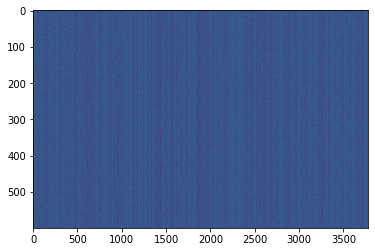

,AUC,pAUC
Source_0,0.489000,0.522105
Source_1,0.554100,0.498947
Source_2,0.468800,0.494211
Target_0,0.548100,0.485789
Target_1,0.675800,0.655789
Target_2,0.475700,0.492105
mean,0.535250,0.524825
h_mean,0.526815,0.519101


2021-05-30 22:52:45,555 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:946.091827, val_AUC_hmean:0.526815, val_pAUC_hmean:0.519101, best_flag:True
2021-05-30 22:52:45,555 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.13it/s]
2021-05-30 22:52:46,301 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.10it/s]
2021-05-30 22:52:46,348 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.64it/s]
2021-05-30 22:52:46,397 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:652.709554, val_AUC_hmean:0.471958, val_pAUC_hmean:0.513924, best_flag:False
2021-05-30 22:52:46,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.51it/s]
2021-05-30 22:52:47,086 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.58it/s]
2021-05-30 22:52:47,134 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.08it/s]
2021-05-30 22:52:47

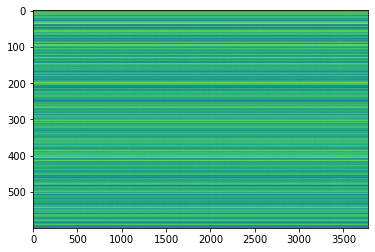

,AUC,pAUC
Source_0,0.534100,0.495263
Source_1,0.474900,0.490000
Source_2,0.713500,0.530526
Target_0,0.489100,0.521579
Target_1,0.706700,0.616316
Target_2,0.484700,0.488947
mean,0.567167,0.523772
h_mean,0.550343,0.520387


2021-05-30 22:52:50,270 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:374.733999, val_AUC_hmean:0.550343, val_pAUC_hmean:0.520387, best_flag:True
2021-05-30 22:52:50,271 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.64it/s]
2021-05-30 22:52:50,954 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.87it/s]
2021-05-30 22:52:51,015 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.92it/s]


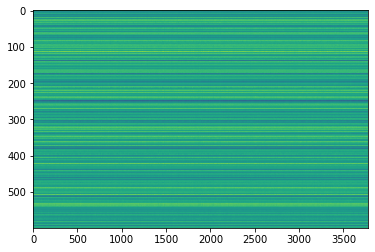

,AUC,pAUC
Source_0,0.566200,0.502632
Source_1,0.466500,0.485263
Source_2,0.817000,0.608947
Target_0,0.502400,0.536316
Target_1,0.689100,0.640526
Target_2,0.502300,0.494737
mean,0.590583,0.544737
h_mean,0.567847,0.538623


2021-05-30 22:52:52,705 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:347.039619, val_AUC_hmean:0.567847, val_pAUC_hmean:0.538623, best_flag:True
2021-05-30 22:52:52,706 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.67it/s]
2021-05-30 22:52:53,176 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.73it/s]
2021-05-30 22:52:53,221 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.39it/s]


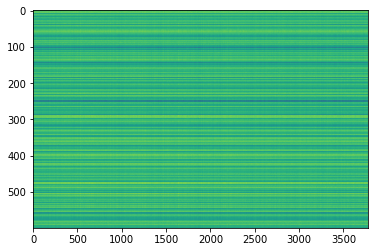

,AUC,pAUC
Source_0,0.609000,0.499474
Source_1,0.477800,0.482632
Source_2,0.824700,0.663158
Target_0,0.469100,0.514211
Target_1,0.721600,0.647368
Target_2,0.454400,0.497895
mean,0.592767,0.550789
h_mean,0.562547,0.541520


2021-05-30 22:52:54,713 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:329.473707, val_AUC_hmean:0.562547, val_pAUC_hmean:0.541520, best_flag:True
2021-05-30 22:52:54,714 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.41it/s]
2021-05-30 22:52:55,405 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.03it/s]
2021-05-30 22:52:55,460 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.75it/s]


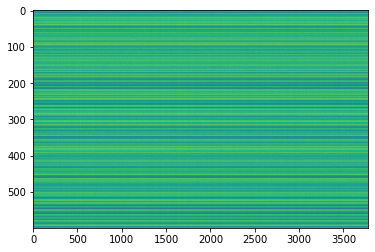

,AUC,pAUC
Source_0,0.592600,0.523684
Source_1,0.511500,0.490526
Source_2,0.823200,0.658947
Target_0,0.528100,0.537368
Target_1,0.727700,0.657895
Target_2,0.432400,0.486842
mean,0.602583,0.559211
h_mean,0.574838,0.550422


2021-05-30 22:52:57,014 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:317.703644, val_AUC_hmean:0.574838, val_pAUC_hmean:0.550422, best_flag:True
2021-05-30 22:52:57,016 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.08it/s]
2021-05-30 22:52:57,764 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.98it/s]
2021-05-30 22:52:57,810 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.49it/s]
2021-05-30 22:52:57,857 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:308.221418, val_AUC_hmean:0.588846, val_pAUC_hmean:0.549148, best_flag:False
2021-05-30 22:52:57,858 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.15it/s]
2021-05-30 22:52:58,559 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.14it/s]
2021-05-30 22:52:58,619 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.81it/s]


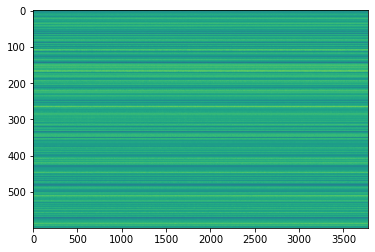

,AUC,pAUC
Source_0,0.612600,0.524737
Source_1,0.653700,0.516842
Source_2,0.780400,0.584211
Target_0,0.550500,0.575263
Target_1,0.807300,0.674737
Target_2,0.364600,0.484737
mean,0.628183,0.560088
h_mean,0.585852,0.553729


2021-05-30 22:53:00,182 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:301.438199, val_AUC_hmean:0.585852, val_pAUC_hmean:0.553729, best_flag:True
2021-05-30 22:53:00,183 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.38it/s]
2021-05-30 22:53:00,876 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.98it/s]
2021-05-30 22:53:00,934 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.56it/s]


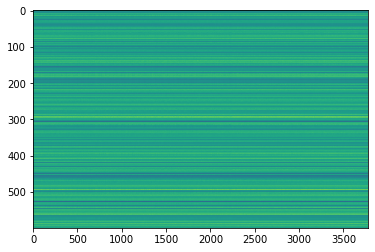

,AUC,pAUC
Source_0,0.597200,0.499474
Source_1,0.577900,0.512105
Source_2,0.785500,0.658421
Target_0,0.539300,0.543684
Target_1,0.780400,0.688947
Target_2,0.443300,0.495789
mean,0.620600,0.566404
h_mean,0.595864,0.556514


2021-05-30 22:53:02,511 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:297.145645, val_AUC_hmean:0.595864, val_pAUC_hmean:0.556514, best_flag:True
2021-05-30 22:53:02,512 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.57it/s]
2021-05-30 22:53:03,198 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.66it/s]
2021-05-30 22:53:03,252 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.35it/s]


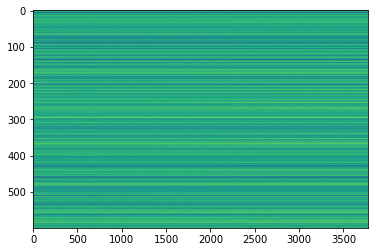

,AUC,pAUC
Source_0,0.660900,0.525263
Source_1,0.577300,0.516842
Source_2,0.793800,0.668421
Target_0,0.567200,0.538947
Target_1,0.760600,0.662632
Target_2,0.439300,0.485263
mean,0.633183,0.566228
h_mean,0.608569,0.557619


2021-05-30 22:53:04,761 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:291.763311, val_AUC_hmean:0.608569, val_pAUC_hmean:0.557619, best_flag:True
2021-05-30 22:53:04,762 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.26it/s]
2021-05-30 22:53:05,550 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.73it/s]
2021-05-30 22:53:05,601 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.79it/s]


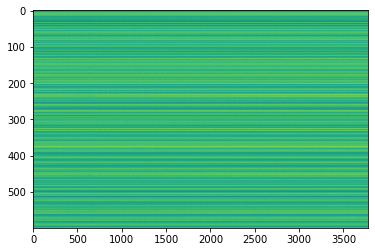

,AUC,pAUC
Source_0,0.630200,0.528421
Source_1,0.612300,0.544211
Source_2,0.795900,0.655789
Target_0,0.600200,0.583158
Target_1,0.806500,0.681579
Target_2,0.361700,0.487895
mean,0.634467,0.580175
h_mean,0.591297,0.572168


2021-05-30 22:53:07,051 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:287.780149, val_AUC_hmean:0.591297, val_pAUC_hmean:0.572168, best_flag:True
2021-05-30 22:53:07,052 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.25it/s]
2021-05-30 22:53:07,750 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.35it/s]
2021-05-30 22:53:07,806 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.21it/s]
2021-05-30 22:53:07,859 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:282.886403, val_AUC_hmean:0.566838, val_pAUC_hmean:0.553617, best_flag:False
2021-05-30 22:53:07,860 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.78it/s]
2021-05-30 22:53:08,537 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.94it/s]
2021-05-30 22:53:08,594 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.76it/s]
2021-05-30 22:53:

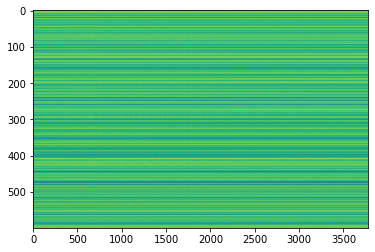

,AUC,pAUC
Source_0,0.626900,0.528947
Source_1,0.632300,0.527895
Source_2,0.796500,0.657368
Target_0,0.616200,0.614211
Target_1,0.763400,0.674211
Target_2,0.381800,0.490000
mean,0.636183,0.582105
h_mean,0.600954,0.573711


2021-05-30 22:53:11,821 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:272.365529, val_AUC_hmean:0.600954, val_pAUC_hmean:0.573711, best_flag:True
2021-05-30 22:53:11,822 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.34it/s]
2021-05-30 22:53:12,516 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.47it/s]
2021-05-30 22:53:12,573 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.78it/s]
2021-05-30 22:53:12,626 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:268.867409, val_AUC_hmean:0.603021, val_pAUC_hmean:0.560853, best_flag:False
2021-05-30 22:53:12,627 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.84it/s]
2021-05-30 22:53:13,302 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.57it/s]
2021-05-30 22:53:13,361 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.99it/s]
2021-05-30 22:53:

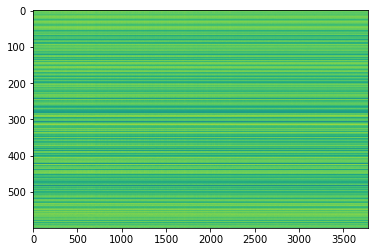

,AUC,pAUC
Source_0,0.674700,0.555263
Source_1,0.634000,0.546316
Source_2,0.808000,0.670000
Target_0,0.609200,0.567368
Target_1,0.770000,0.652105
Target_2,0.475300,0.500526
mean,0.661867,0.581930
h_mean,0.642317,0.575935


2021-05-30 22:53:16,539 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:261.085162, val_AUC_hmean:0.642317, val_pAUC_hmean:0.575935, best_flag:True
2021-05-30 22:53:16,540 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.57it/s]
2021-05-30 22:53:17,225 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.69it/s]
2021-05-30 22:53:17,268 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.66it/s]


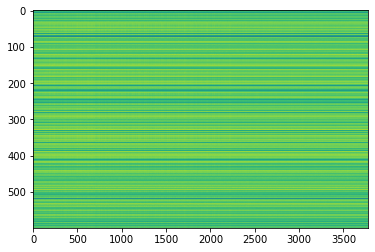

,AUC,pAUC
Source_0,0.680000,0.556316
Source_1,0.668800,0.544737
Source_2,0.817100,0.704211
Target_0,0.676600,0.588421
Target_1,0.759600,0.672632
Target_2,0.403700,0.489474
mean,0.667633,0.592632
h_mean,0.634170,0.583516


2021-05-30 22:53:18,838 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:259.083364, val_AUC_hmean:0.634170, val_pAUC_hmean:0.583516, best_flag:True
2021-05-30 22:53:18,839 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.51it/s]
2021-05-30 22:53:19,526 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.04it/s]
2021-05-30 22:53:19,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.08it/s]


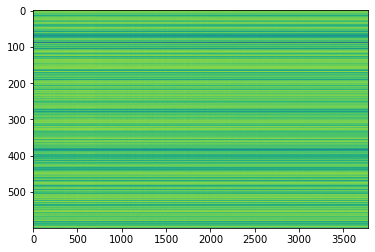

,AUC,pAUC
Source_0,0.688900,0.597368
Source_1,0.679700,0.579474
Source_2,0.794400,0.681053
Target_0,0.644000,0.601053
Target_1,0.770700,0.664211
Target_2,0.431700,0.494211
mean,0.668233,0.602895
h_mean,0.641823,0.596377


2021-05-30 22:53:21,190 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:256.452037, val_AUC_hmean:0.641823, val_pAUC_hmean:0.596377, best_flag:True
2021-05-30 22:53:21,191 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.73it/s]
2021-05-30 22:53:21,642 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.52it/s]
2021-05-30 22:53:21,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.71it/s]
2021-05-30 22:53:21,721 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:253.546893, val_AUC_hmean:0.619759, val_pAUC_hmean:0.570493, best_flag:False
2021-05-30 22:53:21,722 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.13it/s]
2021-05-30 22:53:22,385 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.73it/s]
2021-05-30 22:53:22,437 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.97it/s]
2021-05-30 22:5

100%|██████████| 2/2 [00:00<00:00, 57.28it/s]
2021-05-30 22:53:33,561 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.02it/s]
2021-05-30 22:53:33,616 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:223.850277, val_AUC_hmean:0.625125, val_pAUC_hmean:0.581734, best_flag:False
2021-05-30 22:53:33,617 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.84it/s]
2021-05-30 22:53:34,292 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.93it/s]
2021-05-30 22:53:34,349 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.61it/s]
2021-05-30 22:53:34,405 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:222.048257, val_AUC_hmean:0.624826, val_pAUC_hmean:0.577492, best_flag:False
2021-05-30 22:53:34,407 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.68it/s]
2021-05-30 22:53:35,087 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 26.77it/s]
2021-05-30 22:53:46,544 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.12it/s]
2021-05-30 22:53:46,583 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.91it/s]
2021-05-30 22:53:46,626 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:197.641780, val_AUC_hmean:0.644886, val_pAUC_hmean:0.587029, best_flag:False
2021-05-30 22:53:46,627 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.47it/s]
2021-05-30 22:53:47,083 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.20it/s]
2021-05-30 22:53:47,138 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.04it/s]
2021-05-30 22:53:47,188 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:196.763776, val_AUC_hmean:0.619118, val_pAUC_hmean:0.572798, best_flag:False
2021-05-30 22:53:47,189 - pytorch_modeler.py - INFO - train
100%|██████████

2021-05-30 22:53:59,485 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.35it/s]
2021-05-30 22:54:00,221 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.70it/s]
2021-05-30 22:54:00,262 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.00it/s]
2021-05-30 22:54:00,307 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:174.394517, val_AUC_hmean:0.635926, val_pAUC_hmean:0.581680, best_flag:False
2021-05-30 22:54:00,308 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.78it/s]
2021-05-30 22:54:01,026 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.85it/s]
2021-05-30 22:54:01,066 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.16it/s]
2021-05-30 22:54:01,113 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:174.045188, val_AUC_hmean:0.629515, val_pAUC_hmean:0.577286, best_flag:False
2021-05-30 22:54

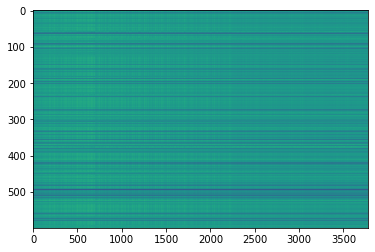

,AUC,pAUC
Source_0,0.757400,0.593684
Source_1,0.711500,0.565263
Source_2,0.827500,0.702105
Target_0,0.690300,0.615263
Target_1,0.716700,0.647895
Target_2,0.386500,0.500000
mean,0.681650,0.604035
h_mean,0.640649,0.597220


2021-05-30 22:54:03,579 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:172.351786, val_AUC_hmean:0.640649, val_pAUC_hmean:0.597220, best_flag:True
2021-05-30 22:54:03,580 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.86it/s]
2021-05-30 22:54:04,046 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.00it/s]
2021-05-30 22:54:04,085 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.01it/s]
2021-05-30 22:54:04,126 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:171.059728, val_AUC_hmean:0.604574, val_pAUC_hmean:0.575660, best_flag:False
2021-05-30 22:54:04,128 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.84it/s]
2021-05-30 22:54:04,842 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.90it/s]
2021-05-30 22:54:04,895 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.32it/s]
2021-05-30 22:5

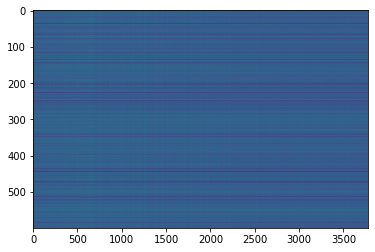

,AUC,pAUC
Source_0,0.718300,0.594211
Source_1,0.705800,0.579474
Source_2,0.786500,0.677895
Target_0,0.610900,0.613158
Target_1,0.716800,0.647368
Target_2,0.372400,0.505263
mean,0.651783,0.602895
h_mean,0.612384,0.597696


2021-05-30 22:54:08,469 - pytorch_modeler.py - INFO - epoch:80/300, train_losses:167.242561, val_AUC_hmean:0.612384, val_pAUC_hmean:0.597696, best_flag:True
2021-05-30 22:54:08,470 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.44it/s]
2021-05-30 22:54:09,160 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.23it/s]
2021-05-30 22:54:09,216 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.70it/s]
2021-05-30 22:54:09,265 - pytorch_modeler.py - INFO - epoch:81/300, train_losses:166.068703, val_AUC_hmean:0.614014, val_pAUC_hmean:0.581396, best_flag:False
2021-05-30 22:54:09,266 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.43it/s]
2021-05-30 22:54:09,956 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.65it/s]
2021-05-30 22:54:10,011 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.34it/s]
2021-05-30 22:54:

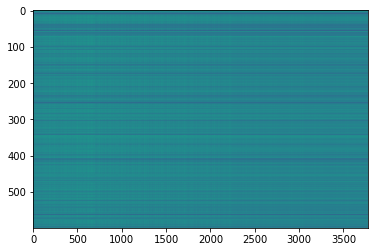

,AUC,pAUC
Source_0,0.721900,0.614737
Source_1,0.650500,0.529474
Source_2,0.808100,0.705263
Target_0,0.654500,0.612632
Target_1,0.701900,0.667368
Target_2,0.412700,0.506842
mean,0.658267,0.606053
h_mean,0.629218,0.597787


2021-05-30 22:54:12,269 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:163.596565, val_AUC_hmean:0.629218, val_pAUC_hmean:0.597787, best_flag:True
2021-05-30 22:54:12,270 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.64it/s]
2021-05-30 22:54:12,952 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.56it/s]
2021-05-30 22:54:13,008 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.27it/s]
2021-05-30 22:54:13,061 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:162.377992, val_AUC_hmean:0.613317, val_pAUC_hmean:0.582934, best_flag:False
2021-05-30 22:54:13,062 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.68it/s]
2021-05-30 22:54:13,783 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.07it/s]
2021-05-30 22:54:13,847 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.34it/s]


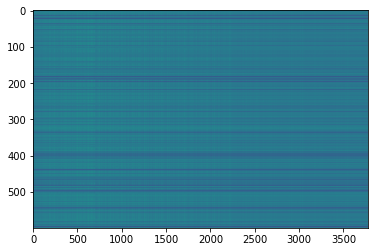

,AUC,pAUC
Source_0,0.726400,0.588421
Source_1,0.712500,0.582632
Source_2,0.784100,0.689474
Target_0,0.672000,0.607368
Target_1,0.724100,0.660000
Target_2,0.407300,0.500526
mean,0.671067,0.604737
h_mean,0.639671,0.598462


2021-05-30 22:54:15,348 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:161.238497, val_AUC_hmean:0.639671, val_pAUC_hmean:0.598462, best_flag:True
2021-05-30 22:54:15,349 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 22:54:16,017 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 15.32it/s]
2021-05-30 22:54:16,167 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.48it/s]
2021-05-30 22:54:16,208 - pytorch_modeler.py - INFO - epoch:86/300, train_losses:160.530425, val_AUC_hmean:0.622312, val_pAUC_hmean:0.582121, best_flag:False
2021-05-30 22:54:16,212 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.62it/s]
2021-05-30 22:54:16,895 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.15it/s]
2021-05-30 22:54:16,942 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.45it/s]


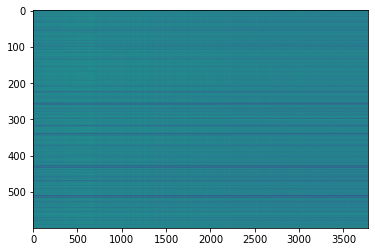

,AUC,pAUC
Source_0,0.742600,0.614211
Source_1,0.703000,0.590000
Source_2,0.801400,0.713158
Target_0,0.685700,0.613158
Target_1,0.707800,0.650526
Target_2,0.380700,0.508947
mean,0.670200,0.615000
h_mean,0.630594,0.608631


2021-05-30 22:54:18,497 - pytorch_modeler.py - INFO - epoch:87/300, train_losses:158.581504, val_AUC_hmean:0.630594, val_pAUC_hmean:0.608631, best_flag:True
2021-05-30 22:54:18,498 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.81it/s]
2021-05-30 22:54:19,214 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.27it/s]
2021-05-30 22:54:19,261 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.10it/s]
2021-05-30 22:54:19,307 - pytorch_modeler.py - INFO - epoch:88/300, train_losses:158.284400, val_AUC_hmean:0.631748, val_pAUC_hmean:0.590438, best_flag:False
2021-05-30 22:54:19,308 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.11it/s]
2021-05-30 22:54:20,011 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.19it/s]
2021-05-30 22:54:20,072 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.83it/s]
2021-05-30 22:54:

100%|██████████| 2/2 [00:00<00:00, 49.51it/s]
2021-05-30 22:54:31,257 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.25it/s]
2021-05-30 22:54:31,311 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:139.792332, val_AUC_hmean:0.640144, val_pAUC_hmean:0.598291, best_flag:False
2021-05-30 22:54:31,312 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.94it/s]
2021-05-30 22:54:31,983 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.35it/s]
2021-05-30 22:54:32,042 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.99it/s]
2021-05-30 22:54:32,095 - pytorch_modeler.py - INFO - epoch:105/300, train_losses:138.751821, val_AUC_hmean:0.607328, val_pAUC_hmean:0.584210, best_flag:False
2021-05-30 22:54:32,096 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.88it/s]
2021-05-30 22:54:32,769 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-05-30 22:54:44,118 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.81it/s]
2021-05-30 22:54:44,794 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.06it/s]
2021-05-30 22:54:44,851 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.51it/s]
2021-05-30 22:54:44,902 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:122.062909, val_AUC_hmean:0.617448, val_pAUC_hmean:0.598374, best_flag:False
2021-05-30 22:54:44,903 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.59it/s]
2021-05-30 22:54:45,487 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.48it/s]
2021-05-30 22:54:45,527 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.39it/s]
2021-05-30 22:54:45,568 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:121.310858, val_AUC_hmean:0.621606, val_pAUC_hmean:0.595843, best_flag:False
2021-05-30 22

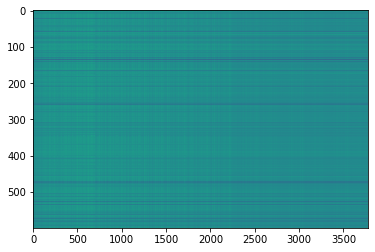

,AUC,pAUC
Source_0,0.751400,0.646842
Source_1,0.690200,0.579474
Source_2,0.820900,0.705789
Target_0,0.674800,0.594737
Target_1,0.714800,0.664211
Target_2,0.401200,0.506316
mean,0.675550,0.616228
h_mean,0.640252,0.609103


2021-05-30 22:54:51,207 - pytorch_modeler.py - INFO - epoch:128/300, train_losses:116.128707, val_AUC_hmean:0.640252, val_pAUC_hmean:0.609103, best_flag:True
2021-05-30 22:54:51,207 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.81it/s]
2021-05-30 22:54:51,884 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.52it/s]
2021-05-30 22:54:51,930 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.17it/s]
2021-05-30 22:54:51,980 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:115.585846, val_AUC_hmean:0.613629, val_pAUC_hmean:0.596078, best_flag:False
2021-05-30 22:54:51,981 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.01it/s]
2021-05-30 22:54:52,688 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.89it/s]
2021-05-30 22:54:52,744 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.56it/s]
2021-05-30 22:5

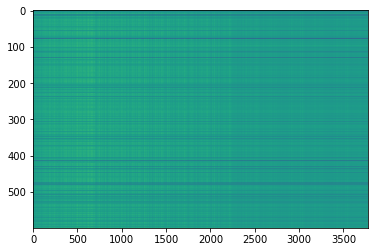

,AUC,pAUC
Source_0,0.729500,0.619474
Source_1,0.723700,0.597368
Source_2,0.773900,0.703158
Target_0,0.673600,0.610000
Target_1,0.731500,0.662632
Target_2,0.330700,0.510526
mean,0.660483,0.617193
h_mean,0.604823,0.611142


2021-05-30 22:54:56,052 - pytorch_modeler.py - INFO - epoch:132/300, train_losses:112.074672, val_AUC_hmean:0.604823, val_pAUC_hmean:0.611142, best_flag:True
2021-05-30 22:54:56,052 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.23it/s]
2021-05-30 22:54:56,594 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.09it/s]
2021-05-30 22:54:56,651 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.30it/s]
2021-05-30 22:54:56,701 - pytorch_modeler.py - INFO - epoch:133/300, train_losses:112.160349, val_AUC_hmean:0.588741, val_pAUC_hmean:0.590114, best_flag:False
2021-05-30 22:54:56,702 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.92it/s]
2021-05-30 22:54:57,374 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.36it/s]
2021-05-30 22:54:57,430 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.66it/s]
2021-05-30 22:5

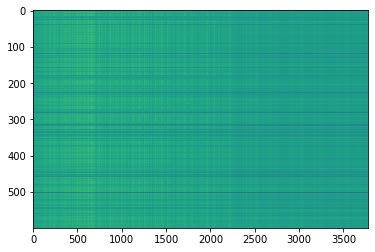

,AUC,pAUC
Source_0,0.743400,0.617895
Source_1,0.726100,0.616316
Source_2,0.795200,0.706842
Target_0,0.640000,0.621053
Target_1,0.694100,0.675263
Target_2,0.379500,0.502105
mean,0.663050,0.623246
h_mean,0.623818,0.616119


2021-05-30 22:55:00,490 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:108.476204, val_AUC_hmean:0.623818, val_pAUC_hmean:0.616119, best_flag:True
2021-05-30 22:55:00,491 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.97it/s]
2021-05-30 22:55:01,200 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.04it/s]
2021-05-30 22:55:01,246 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.48it/s]
2021-05-30 22:55:01,292 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:107.392860, val_AUC_hmean:0.647692, val_pAUC_hmean:0.603992, best_flag:False
2021-05-30 22:55:01,293 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.80it/s]
2021-05-30 22:55:02,009 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.71it/s]
2021-05-30 22:55:02,052 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.46it/s]
2021-05-30 22:5

100%|██████████| 2/2 [00:00<00:00, 90.29it/s]
2021-05-30 22:55:14,262 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.04it/s]
2021-05-30 22:55:14,309 - pytorch_modeler.py - INFO - epoch:153/300, train_losses:94.375342, val_AUC_hmean:0.616004, val_pAUC_hmean:0.589873, best_flag:False
2021-05-30 22:55:14,310 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.86it/s]
2021-05-30 22:55:15,024 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.76it/s]
2021-05-30 22:55:15,064 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.47it/s]
2021-05-30 22:55:15,109 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:93.552092, val_AUC_hmean:0.593155, val_pAUC_hmean:0.594089, best_flag:False
2021-05-30 22:55:15,110 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.64it/s]
2021-05-30 22:55:15,834 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 16.78it/s]
2021-05-30 22:55:28,002 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.84it/s]
2021-05-30 22:55:28,046 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.81it/s]
2021-05-30 22:55:28,091 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:81.676152, val_AUC_hmean:0.601923, val_pAUC_hmean:0.599970, best_flag:False
2021-05-30 22:55:28,092 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.76it/s]
2021-05-30 22:55:28,810 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.75it/s]
2021-05-30 22:55:28,857 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.17it/s]


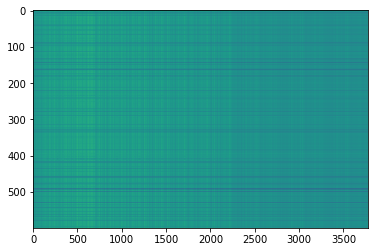

,AUC,pAUC
Source_0,0.747300,0.648947
Source_1,0.704300,0.598421
Source_2,0.810100,0.718421
Target_0,0.658600,0.601053
Target_1,0.702300,0.671579
Target_2,0.452900,0.506842
mean,0.679250,0.624211
h_mean,0.656263,0.616666


2021-05-30 22:55:30,327 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:81.437824, val_AUC_hmean:0.656263, val_pAUC_hmean:0.616666, best_flag:True
2021-05-30 22:55:30,328 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.31it/s]
2021-05-30 22:55:31,023 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.89it/s]
2021-05-30 22:55:31,079 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.73it/s]
2021-05-30 22:55:31,131 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:80.096062, val_AUC_hmean:0.634534, val_pAUC_hmean:0.612316, best_flag:False
2021-05-30 22:55:31,132 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.83it/s]
2021-05-30 22:55:31,808 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.63it/s]
2021-05-30 22:55:31,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.87it/s]
2021-05-30 22:55:

100%|██████████| 2/2 [00:00<00:00, 55.45it/s]
2021-05-30 22:55:43,990 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.97it/s]
2021-05-30 22:55:44,042 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:69.229430, val_AUC_hmean:0.667232, val_pAUC_hmean:0.600442, best_flag:False
2021-05-30 22:55:44,043 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.33it/s]
2021-05-30 22:55:44,737 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.55it/s]
2021-05-30 22:55:44,793 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.02it/s]
2021-05-30 22:55:44,852 - pytorch_modeler.py - INFO - epoch:189/300, train_losses:68.635980, val_AUC_hmean:0.654687, val_pAUC_hmean:0.602075, best_flag:False
2021-05-30 22:55:44,853 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.86it/s]
2021-05-30 22:55:45,526 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 17.82it/s]
2021-05-30 22:55:57,498 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.07it/s]
2021-05-30 22:55:57,556 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.23it/s]
2021-05-30 22:55:57,609 - pytorch_modeler.py - INFO - epoch:205/300, train_losses:59.294866, val_AUC_hmean:0.631000, val_pAUC_hmean:0.599959, best_flag:False
2021-05-30 22:55:57,610 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.84it/s]
2021-05-30 22:55:58,284 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.56it/s]
2021-05-30 22:55:58,339 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.56it/s]
2021-05-30 22:55:58,392 - pytorch_modeler.py - INFO - epoch:206/300, train_losses:58.264560, val_AUC_hmean:0.620899, val_pAUC_hmean:0.596486, best_flag:False
2021-05-30 22:55:58,393 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-30 22:56:10,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.78it/s]
2021-05-30 22:56:10,884 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.99it/s]
2021-05-30 22:56:10,942 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.88it/s]
2021-05-30 22:56:10,993 - pytorch_modeler.py - INFO - epoch:222/300, train_losses:51.023872, val_AUC_hmean:0.615255, val_pAUC_hmean:0.602667, best_flag:False
2021-05-30 22:56:10,994 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.87it/s]
2021-05-30 22:56:11,667 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.20it/s]
2021-05-30 22:56:11,721 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.94it/s]
2021-05-30 22:56:11,772 - pytorch_modeler.py - INFO - epoch:223/300, train_losses:49.474856, val_AUC_hmean:0.638139, val_pAUC_hmean:0.605879, best_flag:False
2021-05-30 22:56

100%|██████████| 2/2 [00:00<00:00, 62.65it/s]
2021-05-30 22:56:23,788 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:42.547139, val_AUC_hmean:0.596723, val_pAUC_hmean:0.591115, best_flag:False
2021-05-30 22:56:23,789 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.56it/s]
2021-05-30 22:56:24,474 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.82it/s]
2021-05-30 22:56:24,520 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.72it/s]
2021-05-30 22:56:24,570 - pytorch_modeler.py - INFO - epoch:239/300, train_losses:42.483684, val_AUC_hmean:0.644778, val_pAUC_hmean:0.600372, best_flag:False
2021-05-30 22:56:24,571 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.69it/s]
2021-05-30 22:56:25,251 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.42it/s]
2021-05-30 22:56:25,311 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 2/2 [00:00<00:00, 106.63it/s]
2021-05-30 22:56:36,543 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.40it/s]
2021-05-30 22:56:36,582 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:36.717456, val_AUC_hmean:0.658263, val_pAUC_hmean:0.599828, best_flag:False
2021-05-30 22:56:36,583 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.04it/s]
2021-05-30 22:56:37,029 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.30it/s]
2021-05-30 22:56:37,066 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.23it/s]
2021-05-30 22:56:37,106 - pytorch_modeler.py - INFO - epoch:256/300, train_losses:35.446030, val_AUC_hmean:0.648657, val_pAUC_hmean:0.597885, best_flag:False
2021-05-30 22:56:37,108 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.29it/s]
2021-05-30 22:56:37,549 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 22:56:45,021 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.13it/s]
2021-05-30 22:56:45,465 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.55it/s]
2021-05-30 22:56:45,502 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.26it/s]
2021-05-30 22:56:45,541 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:33.548315, val_AUC_hmean:0.601549, val_pAUC_hmean:0.596870, best_flag:False
2021-05-30 22:56:45,542 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.76it/s]
2021-05-30 22:56:45,992 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.17it/s]
2021-05-30 22:56:46,030 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.58it/s]
2021-05-30 22:56:46,069 - pytorch_modeler.py - INFO - epoch:273/300, train_losses:31.562700, val_AUC_hmean:0.597154, val_pAUC_hmean:0.598951, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 107.27it/s]
2021-05-30 22:56:53,996 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:25.412906, val_AUC_hmean:0.664108, val_pAUC_hmean:0.601797, best_flag:False
2021-05-30 22:56:53,997 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 22:56:54,438 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.32it/s]
2021-05-30 22:56:54,476 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.87it/s]
2021-05-30 22:56:54,516 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:24.879580, val_AUC_hmean:0.642878, val_pAUC_hmean:0.602860, best_flag:False
2021-05-30 22:56:54,517 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 22:56:54,959 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.40it/s]
2021-05-30 22:56:54,997 - pytorch_modeler.py - INFO - valid_target
100%|███████

,AUC,pAUC
Source_0,0.747300,0.648947
Source_1,0.704300,0.598421
Source_2,0.810100,0.718421
Target_0,0.658600,0.601053
Target_1,0.702300,0.671579
Target_2,0.452900,0.506842
mean,0.679250,0.624211
h_mean,0.656263,0.616666


2021-05-30 22:57:00,238 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyTrain
2021-05-30 22:57:00,238 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 22:57:00,290 - 00_train.py - INFO - TRAINING


elapsed time: 257.393919945 [sec]


2021-05-30 22:57:00,663 - pytorch_modeler.py - INFO - train
 25%|██▌       | 3/12 [00:00<00:00, 27.47it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 27.47it/s]
2021-05-30 22:57:01,102 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.95it/s]
2021-05-30 22:57:01,140 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.90it/s]


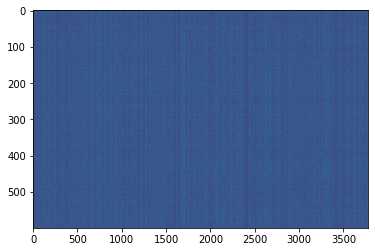

,AUC,pAUC
Source_0,0.640300,0.571579
Source_1,0.553500,0.544211
Source_2,0.501600,0.531053
Target_0,0.870700,0.716842
Target_1,0.591800,0.537895
Target_2,0.633200,0.590000
mean,0.631850,0.581930
h_mean,0.613521,0.575863


2021-05-30 22:57:02,527 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:841.024043, val_AUC_hmean:0.613521, val_pAUC_hmean:0.575863, best_flag:True
2021-05-30 22:57:02,528 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 22:57:02,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.76it/s]
2021-05-30 22:57:03,005 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.78it/s]
2021-05-30 22:57:03,045 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:556.201607, val_AUC_hmean:0.551944, val_pAUC_hmean:0.541767, best_flag:False
2021-05-30 22:57:03,046 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.52it/s]
2021-05-30 22:57:03,484 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.22it/s]
2021-05-30 22:57:03,522 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.80it/s]
2021-05-30 22:5

100%|██████████| 2/2 [00:00<00:00, 96.98it/s]
2021-05-30 22:57:11,415 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.62it/s]
2021-05-30 22:57:11,455 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:272.709061, val_AUC_hmean:0.641875, val_pAUC_hmean:0.551505, best_flag:False
2021-05-30 22:57:11,456 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 22:57:11,897 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.40it/s]
2021-05-30 22:57:11,934 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.16it/s]
2021-05-30 22:57:11,975 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:269.448303, val_AUC_hmean:0.614386, val_pAUC_hmean:0.533996, best_flag:False
2021-05-30 22:57:11,976 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.43it/s]
2021-05-30 22:57:12,415 - pytorch_modeler.py - INFO - valid_source
100%|████████

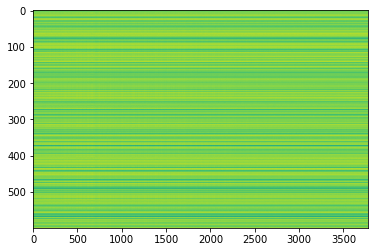

,AUC,pAUC
Source_0,0.670500,0.579474
Source_1,0.710400,0.630526
Source_2,0.805100,0.568947
Target_0,0.650400,0.637895
Target_1,0.674900,0.547895
Target_2,0.539800,0.513684
mean,0.675183,0.579737
h_mean,0.665711,0.576432


2021-05-30 22:57:15,893 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:259.740518, val_AUC_hmean:0.665711, val_pAUC_hmean:0.576432, best_flag:True
2021-05-30 22:57:15,894 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.01it/s]
2021-05-30 22:57:16,340 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.59it/s]
2021-05-30 22:57:16,377 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.38it/s]
2021-05-30 22:57:16,416 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:256.946635, val_AUC_hmean:0.655463, val_pAUC_hmean:0.556990, best_flag:False
2021-05-30 22:57:16,417 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.65it/s]
2021-05-30 22:57:16,852 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.20it/s]
2021-05-30 22:57:16,890 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.84it/s]
2021-05-30 22

100%|██████████| 2/2 [00:00<00:00, 105.93it/s]
2021-05-30 22:57:24,688 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.59it/s]
2021-05-30 22:57:24,728 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:223.313695, val_AUC_hmean:0.679436, val_pAUC_hmean:0.555487, best_flag:False
2021-05-30 22:57:24,729 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.57it/s]
2021-05-30 22:57:25,165 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.76it/s]
2021-05-30 22:57:25,203 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.64it/s]
2021-05-30 22:57:25,243 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:221.867009, val_AUC_hmean:0.670481, val_pAUC_hmean:0.555993, best_flag:False
2021-05-30 22:57:25,245 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 22:57:25,687 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 22:57:33,151 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.43it/s]
2021-05-30 22:57:33,590 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.14it/s]
2021-05-30 22:57:33,629 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.47it/s]
2021-05-30 22:57:33,669 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:196.867420, val_AUC_hmean:0.690544, val_pAUC_hmean:0.554135, best_flag:False
2021-05-30 22:57:33,670 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.30it/s]
2021-05-30 22:57:34,111 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.32it/s]
2021-05-30 22:57:34,148 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.19it/s]
2021-05-30 22:57:34,189 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:195.853650, val_AUC_hmean:0.685698, val_pAUC_hmean:0.551756, best_flag:False
2021-05-30 22:

100%|██████████| 2/2 [00:00<00:00, 103.83it/s]
2021-05-30 22:57:42,279 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:177.383545, val_AUC_hmean:0.645973, val_pAUC_hmean:0.531681, best_flag:False
2021-05-30 22:57:42,280 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.39it/s]
2021-05-30 22:57:42,719 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.33it/s]
2021-05-30 22:57:42,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.75it/s]
2021-05-30 22:57:42,797 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:174.748310, val_AUC_hmean:0.696949, val_pAUC_hmean:0.560746, best_flag:False
2021-05-30 22:57:42,798 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.51it/s]
2021-05-30 22:57:43,236 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.56it/s]
2021-05-30 22:57:43,273 - pytorch_modeler.py - INFO - valid_target
100%|███████

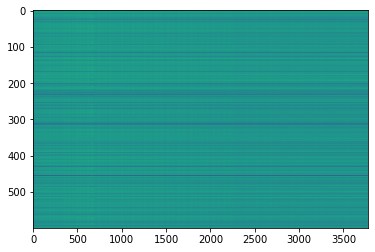

,AUC,pAUC
Source_0,0.711000,0.652632
Source_1,0.768100,0.666316
Source_2,0.785500,0.510000
Target_0,0.543600,0.517895
Target_1,0.698700,0.598947
Target_2,0.722700,0.598947
mean,0.704933,0.590789
h_mean,0.694768,0.584572


2021-05-30 22:57:49,342 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:160.991784, val_AUC_hmean:0.694768, val_pAUC_hmean:0.584572, best_flag:True
2021-05-30 22:57:49,343 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.46it/s]
2021-05-30 22:57:49,781 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.53it/s]
2021-05-30 22:57:49,818 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.40it/s]
2021-05-30 22:57:49,859 - pytorch_modeler.py - INFO - epoch:86/300, train_losses:159.346347, val_AUC_hmean:0.693440, val_pAUC_hmean:0.569585, best_flag:False
2021-05-30 22:57:49,860 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.38it/s]
2021-05-30 22:57:50,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.62it/s]
2021-05-30 22:57:50,339 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.80it/s]
2021-05-30 22:

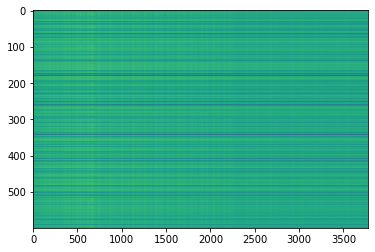

,AUC,pAUC
Source_0,0.838300,0.699474
Source_1,0.754200,0.656316
Source_2,0.804100,0.494211
Target_0,0.515800,0.496842
Target_1,0.704400,0.586842
Target_2,0.802000,0.642105
mean,0.736467,0.595965
h_mean,0.717044,0.585317


2021-05-30 22:57:53,780 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:153.705346, val_AUC_hmean:0.717044, val_pAUC_hmean:0.585317, best_flag:True
2021-05-30 22:57:53,780 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.41it/s]
2021-05-30 22:57:54,220 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.47it/s]
2021-05-30 22:57:54,258 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.90it/s]
2021-05-30 22:57:54,297 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:152.280120, val_AUC_hmean:0.716773, val_pAUC_hmean:0.569226, best_flag:False
2021-05-30 22:57:54,298 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.55it/s]
2021-05-30 22:57:54,735 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.19it/s]
2021-05-30 22:57:54,772 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.21it/s]
2021-05-30 22

100%|██████████| 2/2 [00:00<00:00, 105.16it/s]
2021-05-30 22:58:02,661 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.81it/s]
2021-05-30 22:58:02,701 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:135.203777, val_AUC_hmean:0.662242, val_pAUC_hmean:0.556851, best_flag:False
2021-05-30 22:58:02,702 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.92it/s]
2021-05-30 22:58:03,150 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.44it/s]
2021-05-30 22:58:03,187 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.49it/s]
2021-05-30 22:58:03,228 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:134.339495, val_AUC_hmean:0.687605, val_pAUC_hmean:0.578988, best_flag:False
2021-05-30 22:58:03,229 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.19it/s]
2021-05-30 22:58:03,672 - pytorch_modeler.py - INFO - valid_source
100%|█████

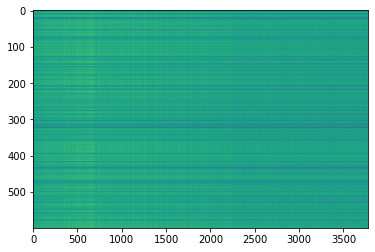

,AUC,pAUC
Source_0,0.731600,0.668947
Source_1,0.745200,0.648421
Source_2,0.781000,0.483158
Target_0,0.550100,0.536842
Target_1,0.658600,0.599474
Target_2,0.803700,0.624211
mean,0.711700,0.593509
h_mean,0.700144,0.585954


2021-05-30 22:58:08,812 - pytorch_modeler.py - INFO - epoch:117/300, train_losses:125.898710, val_AUC_hmean:0.700144, val_pAUC_hmean:0.585954, best_flag:True
2021-05-30 22:58:08,813 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.49it/s]
2021-05-30 22:58:09,268 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.68it/s]
2021-05-30 22:58:09,306 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.16it/s]
2021-05-30 22:58:09,348 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:124.737846, val_AUC_hmean:0.684590, val_pAUC_hmean:0.572390, best_flag:False
2021-05-30 22:58:09,349 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 22:58:09,789 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.36it/s]
2021-05-30 22:58:09,827 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.77it/s]
2021-05-30 

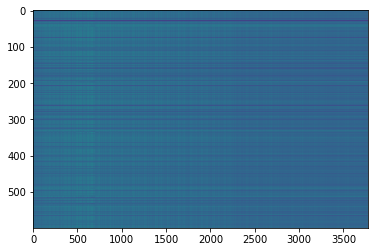

,AUC,pAUC
Source_0,0.628000,0.592632
Source_1,0.745900,0.638421
Source_2,0.807400,0.496842
Target_0,0.614400,0.578421
Target_1,0.702400,0.588947
Target_2,0.789800,0.650000
mean,0.714650,0.590877
h_mean,0.706797,0.586412


2021-05-30 22:58:18,586 - pytorch_modeler.py - INFO - epoch:133/300, train_losses:110.066516, val_AUC_hmean:0.706797, val_pAUC_hmean:0.586412, best_flag:True
2021-05-30 22:58:18,587 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.15it/s]
2021-05-30 22:58:19,030 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.53it/s]
2021-05-30 22:58:19,067 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.90it/s]


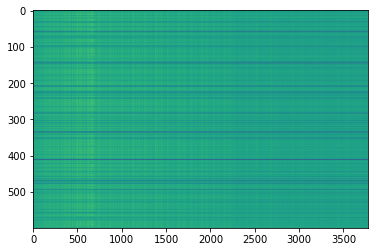

,AUC,pAUC
Source_0,0.698600,0.597368
Source_1,0.779500,0.683158
Source_2,0.822400,0.504737
Target_0,0.629500,0.574737
Target_1,0.662800,0.580000
Target_2,0.805600,0.626316
mean,0.733067,0.594386
h_mean,0.725612,0.589406


2021-05-30 22:58:20,444 - pytorch_modeler.py - INFO - epoch:134/300, train_losses:109.838018, val_AUC_hmean:0.725612, val_pAUC_hmean:0.589406, best_flag:True
2021-05-30 22:58:20,445 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.53it/s]
2021-05-30 22:58:20,882 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.44it/s]
2021-05-30 22:58:20,919 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.58it/s]
2021-05-30 22:58:20,960 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:108.209183, val_AUC_hmean:0.694993, val_pAUC_hmean:0.576813, best_flag:False
2021-05-30 22:58:20,961 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.62it/s]
2021-05-30 22:58:21,397 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.97it/s]
2021-05-30 22:58:21,434 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.77it/s]


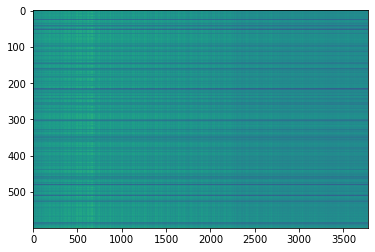

,AUC,pAUC
Source_0,0.764000,0.692105
Source_1,0.779200,0.677368
Source_2,0.779100,0.492105
Target_0,0.555000,0.527895
Target_1,0.649500,0.574737
Target_2,0.819100,0.696842
mean,0.724317,0.610175
h_mean,0.711061,0.598650


2021-05-30 22:58:22,810 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:107.370881, val_AUC_hmean:0.711061, val_pAUC_hmean:0.598650, best_flag:True
2021-05-30 22:58:22,811 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.68it/s]
2021-05-30 22:58:23,246 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.53it/s]
2021-05-30 22:58:23,282 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.87it/s]
2021-05-30 22:58:23,322 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:106.485883, val_AUC_hmean:0.707238, val_pAUC_hmean:0.575300, best_flag:False
2021-05-30 22:58:23,323 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.66it/s]
2021-05-30 22:58:23,758 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 109.47it/s]
2021-05-30 22:58:23,794 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.79it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 106.84it/s]
2021-05-30 22:58:31,580 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.78it/s]
2021-05-30 22:58:31,621 - pytorch_modeler.py - INFO - epoch:153/300, train_losses:92.534970, val_AUC_hmean:0.735165, val_pAUC_hmean:0.576007, best_flag:False
2021-05-30 22:58:31,622 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.60it/s]
2021-05-30 22:58:32,058 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.62it/s]
2021-05-30 22:58:32,095 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.79it/s]
2021-05-30 22:58:32,135 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:92.074595, val_AUC_hmean:0.728300, val_pAUC_hmean:0.579252, best_flag:False
2021-05-30 22:58:32,136 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.08it/s]
2021-05-30 22:58:32,681 - pytorch_modeler.py - INFO - valid_source
100%|███████

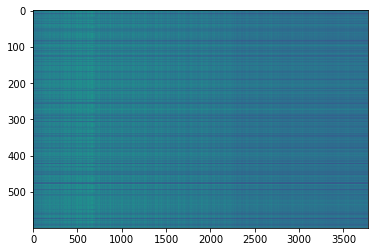

,AUC,pAUC
Source_0,0.817500,0.684211
Source_1,0.780300,0.680526
Source_2,0.805900,0.488421
Target_0,0.597800,0.552105
Target_1,0.690400,0.576842
Target_2,0.816400,0.690000
mean,0.751383,0.612018
h_mean,0.741494,0.601654


2021-05-30 22:58:34,637 - pytorch_modeler.py - INFO - epoch:156/300, train_losses:91.020306, val_AUC_hmean:0.741494, val_pAUC_hmean:0.601654, best_flag:True
2021-05-30 22:58:34,638 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.34it/s]
2021-05-30 22:58:35,079 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.07it/s]
2021-05-30 22:58:35,117 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.14it/s]
2021-05-30 22:58:35,157 - pytorch_modeler.py - INFO - epoch:157/300, train_losses:90.190782, val_AUC_hmean:0.723691, val_pAUC_hmean:0.601383, best_flag:False
2021-05-30 22:58:35,158 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 22:58:35,598 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 91.92it/s]
2021-05-30 22:58:35,638 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.58it/s]
2021-05-30 22:

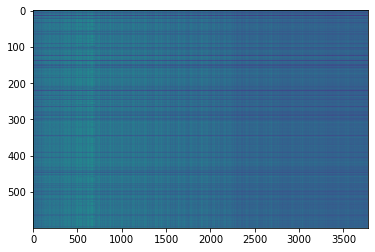

,AUC,pAUC
Source_0,0.857100,0.656316
Source_1,0.795100,0.666316
Source_2,0.772700,0.502632
Target_0,0.572300,0.568421
Target_1,0.682800,0.616316
Target_2,0.835700,0.696842
mean,0.752617,0.617807
h_mean,0.738272,0.610325


2021-05-30 22:58:41,194 - pytorch_modeler.py - INFO - epoch:166/300, train_losses:82.878412, val_AUC_hmean:0.738272, val_pAUC_hmean:0.610325, best_flag:True
2021-05-30 22:58:41,195 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 22:58:41,635 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.22it/s]
2021-05-30 22:58:41,673 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.53it/s]
2021-05-30 22:58:41,713 - pytorch_modeler.py - INFO - epoch:167/300, train_losses:81.908416, val_AUC_hmean:0.732434, val_pAUC_hmean:0.594432, best_flag:False
2021-05-30 22:58:41,714 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.46it/s]
2021-05-30 22:58:42,153 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.92it/s]
2021-05-30 22:58:42,190 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.28it/s]
2021-05-30 22

100%|██████████| 2/2 [00:00<00:00, 104.56it/s]
2021-05-30 22:58:50,097 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.76it/s]
2021-05-30 22:58:50,138 - pytorch_modeler.py - INFO - epoch:183/300, train_losses:72.245173, val_AUC_hmean:0.727990, val_pAUC_hmean:0.593805, best_flag:False
2021-05-30 22:58:50,139 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 22:58:50,580 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.04it/s]
2021-05-30 22:58:50,620 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.86it/s]
2021-05-30 22:58:50,660 - pytorch_modeler.py - INFO - epoch:184/300, train_losses:71.366699, val_AUC_hmean:0.725895, val_pAUC_hmean:0.600493, best_flag:False
2021-05-30 22:58:50,661 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.39it/s]
2021-05-30 22:58:51,101 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 22:58:58,480 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 22:58:58,922 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.92it/s]
2021-05-30 22:58:58,959 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.21it/s]
2021-05-30 22:58:58,998 - pytorch_modeler.py - INFO - epoch:200/300, train_losses:60.797191, val_AUC_hmean:0.704151, val_pAUC_hmean:0.582753, best_flag:False
2021-05-30 22:58:58,999 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.09it/s]
2021-05-30 22:58:59,444 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.04it/s]
2021-05-30 22:58:59,481 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.30it/s]
2021-05-30 22:58:59,522 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:60.552593, val_AUC_hmean:0.692860, val_pAUC_hmean:0.592599, best_flag:False
2021-05-30 2

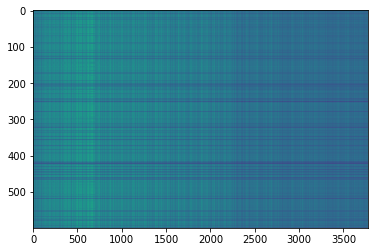

,AUC,pAUC
Source_0,0.818800,0.661053
Source_1,0.783000,0.697895
Source_2,0.809900,0.484737
Target_0,0.618400,0.584737
Target_1,0.656000,0.597368
Target_2,0.828500,0.695789
mean,0.752433,0.620263
h_mean,0.742425,0.610377


2021-05-30 22:59:04,533 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:55.745647, val_AUC_hmean:0.742425, val_pAUC_hmean:0.610377, best_flag:True
2021-05-30 22:59:04,534 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.38it/s]
2021-05-30 22:59:04,974 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.92it/s]
2021-05-30 22:59:05,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.36it/s]
2021-05-30 22:59:05,052 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:54.883709, val_AUC_hmean:0.714064, val_pAUC_hmean:0.587033, best_flag:False
2021-05-30 22:59:05,053 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.46it/s]
2021-05-30 22:59:05,492 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.68it/s]
2021-05-30 22:59:05,530 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.80it/s]
2021-05-30 22

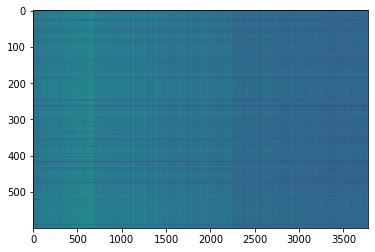

,AUC,pAUC
Source_0,0.792000,0.677368
Source_1,0.822100,0.696842
Source_2,0.806700,0.488421
Target_0,0.641300,0.607368
Target_1,0.680200,0.585263
Target_2,0.819100,0.718947
mean,0.760233,0.629035
h_mean,0.752919,0.618253


2021-05-30 22:59:10,693 - pytorch_modeler.py - INFO - epoch:217/300, train_losses:51.317957, val_AUC_hmean:0.752919, val_pAUC_hmean:0.618253, best_flag:True
2021-05-30 22:59:10,694 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.11it/s]
2021-05-30 22:59:11,139 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.32it/s]
2021-05-30 22:59:11,176 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.43it/s]
2021-05-30 22:59:11,215 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:51.502306, val_AUC_hmean:0.739765, val_pAUC_hmean:0.612629, best_flag:False
2021-05-30 22:59:11,216 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 22:59:11,658 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.77it/s]
2021-05-30 22:59:11,695 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.20it/s]
2021-05-30 22:

100%|██████████| 2/2 [00:00<00:00, 103.17it/s]
2021-05-30 22:59:19,524 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.93it/s]
2021-05-30 22:59:19,565 - pytorch_modeler.py - INFO - epoch:234/300, train_losses:43.278286, val_AUC_hmean:0.730208, val_pAUC_hmean:0.600389, best_flag:False
2021-05-30 22:59:19,567 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 22:59:20,008 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.04it/s]
2021-05-30 22:59:20,046 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.98it/s]
2021-05-30 22:59:20,089 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:42.914201, val_AUC_hmean:0.760020, val_pAUC_hmean:0.590550, best_flag:False
2021-05-30 22:59:20,090 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.10it/s]
2021-05-30 22:59:20,534 - pytorch_modeler.py - INFO - valid_source
100%|█████████

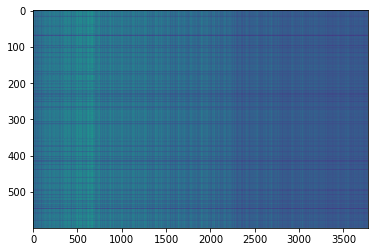

,AUC,pAUC
Source_0,0.856400,0.748421
Source_1,0.734000,0.658947
Source_2,0.824900,0.488421
Target_0,0.627400,0.601579
Target_1,0.670200,0.613158
Target_2,0.832600,0.710526
mean,0.757583,0.636842
h_mean,0.747256,0.624887


2021-05-30 22:59:29,380 - pytorch_modeler.py - INFO - epoch:250/300, train_losses:37.270363, val_AUC_hmean:0.747256, val_pAUC_hmean:0.624887, best_flag:True
2021-05-30 22:59:29,380 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.08it/s]
2021-05-30 22:59:29,825 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.87it/s]
2021-05-30 22:59:29,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.77it/s]
2021-05-30 22:59:29,903 - pytorch_modeler.py - INFO - epoch:251/300, train_losses:40.576178, val_AUC_hmean:0.657818, val_pAUC_hmean:0.561634, best_flag:False
2021-05-30 22:59:29,904 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.42it/s]
2021-05-30 22:59:30,343 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.01it/s]
2021-05-30 22:59:30,381 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.56it/s]
2021-05-30 22:

100%|██████████| 2/2 [00:00<00:00, 106.52it/s]
2021-05-30 22:59:38,181 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.43it/s]
2021-05-30 22:59:38,221 - pytorch_modeler.py - INFO - epoch:267/300, train_losses:29.778859, val_AUC_hmean:0.695665, val_pAUC_hmean:0.587879, best_flag:False
2021-05-30 22:59:38,222 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 22:59:38,662 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.07it/s]
2021-05-30 22:59:38,700 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.04it/s]
2021-05-30 22:59:38,740 - pytorch_modeler.py - INFO - epoch:268/300, train_losses:30.063284, val_AUC_hmean:0.720229, val_pAUC_hmean:0.591309, best_flag:False
2021-05-30 22:59:38,741 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.46it/s]
2021-05-30 22:59:39,179 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 22:59:46,628 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.34it/s]
2021-05-30 22:59:47,068 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.03it/s]
2021-05-30 22:59:47,105 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.88it/s]
2021-05-30 22:59:47,145 - pytorch_modeler.py - INFO - epoch:284/300, train_losses:25.097337, val_AUC_hmean:0.756495, val_pAUC_hmean:0.608162, best_flag:False
2021-05-30 22:59:47,147 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.38it/s]
2021-05-30 22:59:47,586 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.72it/s]
2021-05-30 22:59:47,625 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.85it/s]
2021-05-30 22:59:47,665 - pytorch_modeler.py - INFO - epoch:285/300, train_losses:24.844585, val_AUC_hmean:0.739061, val_pAUC_hmean:0.614783, best_flag:False
2021-05-30 22

100%|██████████| 2/2 [00:00<00:00, 100.34it/s]
2021-05-30 22:59:55,500 - pytorch_modeler.py - INFO - epoch:300/300, train_losses:21.135857, val_AUC_hmean:0.732821, val_pAUC_hmean:0.596921, best_flag:False
2021-05-30 22:59:55,501 - pytorch_modeler.py - INFO - best model, epoch:250/300, train_losses:37.270363, val_pAUC_hmean:0.624887,


,AUC,pAUC
Source_0,0.856400,0.748421
Source_1,0.734000,0.658947
Source_2,0.824900,0.488421
Target_0,0.627400,0.601579
Target_1,0.670200,0.613158
Target_2,0.832600,0.710526
mean,0.757583,0.636842
h_mean,0.747256,0.624887


2021-05-30 22:59:55,506 - 00_train.py - INFO - TARGET MACHINE_TYPE: pump
2021-05-30 22:59:55,506 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 22:59:55,564 - 00_train.py - INFO - TRAINING


elapsed time: 175.267819405 [sec]


2021-05-30 22:59:55,933 - pytorch_modeler.py - INFO - train
 25%|██▌       | 3/12 [00:00<00:00, 27.66it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 27.66it/s]
2021-05-30 22:59:56,369 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.10it/s]
2021-05-30 22:59:56,406 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.97it/s]


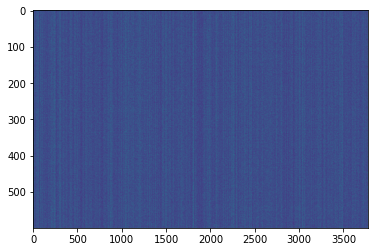

,AUC,pAUC
Source_0,0.376300,0.493684
Source_1,0.428800,0.492632
Source_2,0.562700,0.503158
Target_0,0.575000,0.525789
Target_1,0.477100,0.509474
Target_2,0.517300,0.475789
mean,0.489533,0.500088
h_mean,0.478662,0.499607


2021-05-30 22:59:57,875 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:949.558584, val_AUC_hmean:0.478662, val_pAUC_hmean:0.499607, best_flag:True
2021-05-30 22:59:57,876 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.11it/s]
2021-05-30 22:59:58,321 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.95it/s]
2021-05-30 22:59:58,357 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.26it/s]
2021-05-30 22:59:58,397 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:700.951833, val_AUC_hmean:0.441992, val_pAUC_hmean:0.494854, best_flag:False
2021-05-30 22:59:58,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.21it/s]
2021-05-30 22:59:58,940 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.09it/s]
2021-05-30 22:59:58,977 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.41it/s]


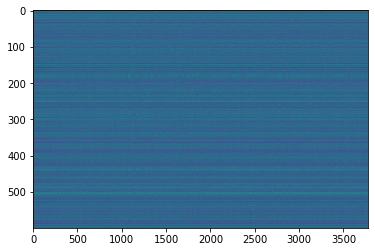

,AUC,pAUC
Source_0,0.627700,0.624211
Source_1,0.406200,0.481053
Source_2,0.645800,0.594211
Target_0,0.512900,0.505263
Target_1,0.543700,0.503684
Target_2,0.550100,0.502632
mean,0.547733,0.535175
h_mean,0.535226,0.530140


2021-05-30 23:00:00,414 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:582.716339, val_AUC_hmean:0.535226, val_pAUC_hmean:0.530140, best_flag:True
2021-05-30 23:00:00,415 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.89it/s]
2021-05-30 23:00:00,863 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.43it/s]
2021-05-30 23:00:00,900 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.91it/s]


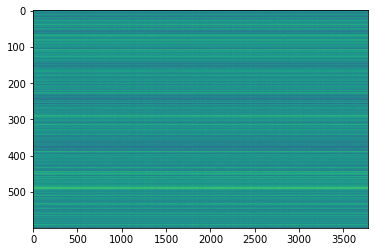

,AUC,pAUC
Source_0,0.677200,0.653158
Source_1,0.605800,0.480526
Source_2,0.609100,0.590526
Target_0,0.559900,0.531053
Target_1,0.630000,0.485263
Target_2,0.602000,0.497368
mean,0.614000,0.539649
h_mean,0.612019,0.532867


2021-05-30 23:00:02,341 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:508.939443, val_AUC_hmean:0.612019, val_pAUC_hmean:0.532867, best_flag:True
2021-05-30 23:00:02,342 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.52it/s]
2021-05-30 23:00:02,780 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.80it/s]
2021-05-30 23:00:02,817 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.63it/s]


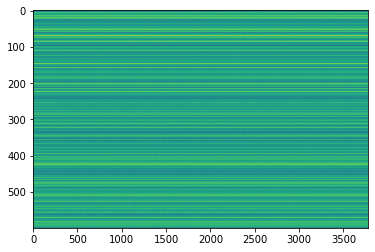

,AUC,pAUC
Source_0,0.633000,0.633684
Source_1,0.612400,0.502632
Source_2,0.622500,0.543158
Target_0,0.585800,0.525263
Target_1,0.660100,0.493158
Target_2,0.563100,0.532632
mean,0.612817,0.538421
h_mean,0.611185,0.534868


2021-05-30 23:00:04,256 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:459.689402, val_AUC_hmean:0.611185, val_pAUC_hmean:0.534868, best_flag:True
2021-05-30 23:00:04,257 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.61it/s]
2021-05-30 23:00:04,694 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 109.12it/s]
2021-05-30 23:00:04,729 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.06it/s]


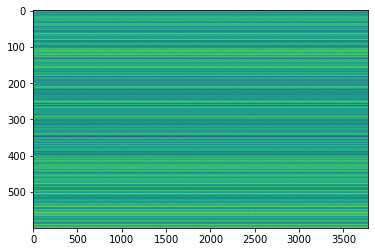

,AUC,pAUC
Source_0,0.668200,0.654211
Source_1,0.721800,0.536316
Source_2,0.565100,0.518421
Target_0,0.586500,0.531053
Target_1,0.687900,0.502632
Target_2,0.568300,0.524737
mean,0.632967,0.544561
h_mean,0.626963,0.540523


2021-05-30 23:00:06,163 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:428.495829, val_AUC_hmean:0.626963, val_pAUC_hmean:0.540523, best_flag:True
2021-05-30 23:00:06,164 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.47it/s]
2021-05-30 23:00:06,602 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.29it/s]
2021-05-30 23:00:06,647 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.53it/s]
2021-05-30 23:00:06,690 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:406.210818, val_AUC_hmean:0.617619, val_pAUC_hmean:0.537104, best_flag:False
2021-05-30 23:00:06,691 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.82it/s]
2021-05-30 23:00:07,140 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.25it/s]
2021-05-30 23:00:07,178 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.37it/s]
2021-05-30 23:00

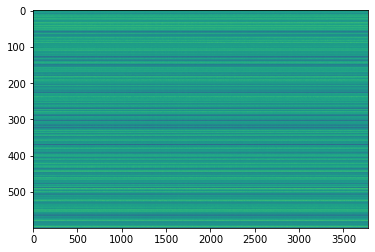

,AUC,pAUC
Source_0,0.657800,0.653684
Source_1,0.798300,0.593158
Source_2,0.570800,0.528421
Target_0,0.571800,0.526316
Target_1,0.651700,0.493158
Target_2,0.471600,0.495263
mean,0.620333,0.548333
h_mean,0.604317,0.542741


2021-05-30 23:00:09,220 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:374.624664, val_AUC_hmean:0.604317, val_pAUC_hmean:0.542741, best_flag:True
2021-05-30 23:00:09,221 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 23:00:09,662 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.62it/s]
2021-05-30 23:00:09,699 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.67it/s]


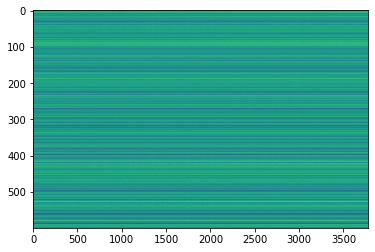

,AUC,pAUC
Source_0,0.641800,0.644737
Source_1,0.802300,0.603158
Source_2,0.643600,0.548947
Target_0,0.568500,0.520000
Target_1,0.687100,0.489474
Target_2,0.462400,0.491579
mean,0.634283,0.549649
h_mean,0.616312,0.543923


2021-05-30 23:00:11,193 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:361.987501, val_AUC_hmean:0.616312, val_pAUC_hmean:0.543923, best_flag:True
2021-05-30 23:00:11,193 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.64it/s]
2021-05-30 23:00:11,630 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.82it/s]
2021-05-30 23:00:11,667 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.61it/s]


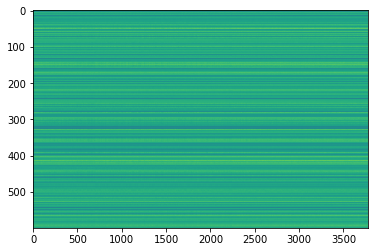

,AUC,pAUC
Source_0,0.628200,0.643158
Source_1,0.761000,0.587895
Source_2,0.641800,0.553684
Target_0,0.565500,0.521053
Target_1,0.697200,0.501053
Target_2,0.451900,0.488947
mean,0.624267,0.549298
h_mean,0.607314,0.544361


2021-05-30 23:00:13,131 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:351.921697, val_AUC_hmean:0.607314, val_pAUC_hmean:0.544361, best_flag:True
2021-05-30 23:00:13,132 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.32it/s]
2021-05-30 23:00:13,573 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.22it/s]
2021-05-30 23:00:13,616 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.47it/s]


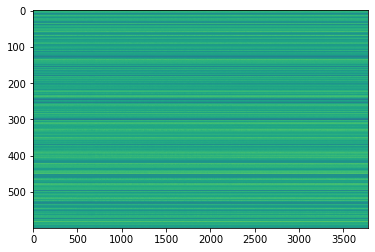

,AUC,pAUC
Source_0,0.64620,0.652632
Source_1,0.78360,0.563684
Source_2,0.64430,0.536842
Target_0,0.53440,0.522105
Target_1,0.70140,0.511579
Target_2,0.48690,0.506316
mean,0.63280,0.548860
h_mean,0.61687,0.544754


2021-05-30 23:00:15,208 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:340.283625, val_AUC_hmean:0.616870, val_pAUC_hmean:0.544754, best_flag:True
2021-05-30 23:00:15,209 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.28it/s]
2021-05-30 23:00:15,651 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.51it/s]
2021-05-30 23:00:15,689 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.92it/s]
2021-05-30 23:00:15,729 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:339.427226, val_AUC_hmean:0.612535, val_pAUC_hmean:0.542331, best_flag:False
2021-05-30 23:00:15,730 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.70it/s]
2021-05-30 23:00:16,164 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.02it/s]
2021-05-30 23:00:16,202 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.09it/s]


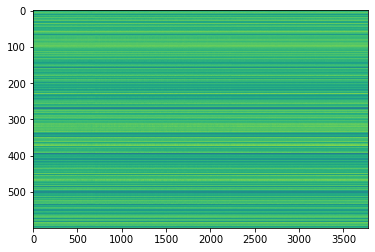

,AUC,pAUC
Source_0,0.638800,0.641053
Source_1,0.762000,0.561053
Source_2,0.697400,0.595263
Target_0,0.619200,0.533684
Target_1,0.693300,0.498947
Target_2,0.513000,0.507895
mean,0.653950,0.556316
h_mean,0.643891,0.552022


2021-05-30 23:00:17,679 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:332.536524, val_AUC_hmean:0.643891, val_pAUC_hmean:0.552022, best_flag:True
2021-05-30 23:00:17,680 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.70it/s]
2021-05-30 23:00:18,115 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.42it/s]
2021-05-30 23:00:18,152 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.04it/s]


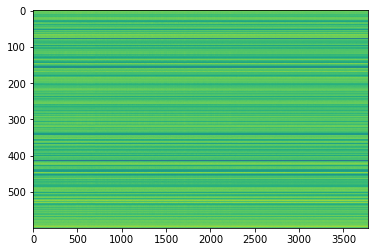

,AUC,pAUC
Source_0,0.648000,0.621053
Source_1,0.818500,0.621579
Source_2,0.683800,0.592632
Target_0,0.560100,0.526842
Target_1,0.671500,0.490526
Target_2,0.519600,0.517368
mean,0.650250,0.561667
h_mean,0.636502,0.556795


2021-05-30 23:00:19,712 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:325.319379, val_AUC_hmean:0.636502, val_pAUC_hmean:0.556795, best_flag:True
2021-05-30 23:00:19,713 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.62it/s]
2021-05-30 23:00:20,149 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.69it/s]
2021-05-30 23:00:20,185 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.56it/s]
2021-05-30 23:00:20,224 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:317.592377, val_AUC_hmean:0.639051, val_pAUC_hmean:0.555291, best_flag:False
2021-05-30 23:00:20,225 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.67it/s]
2021-05-30 23:00:20,660 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.46it/s]
2021-05-30 23:00:20,697 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.15it/s]


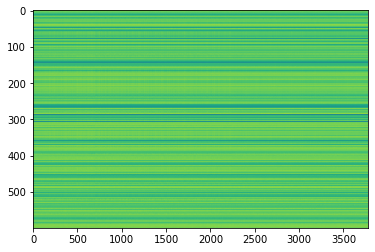

,AUC,pAUC
Source_0,0.638600,0.639474
Source_1,0.840900,0.652632
Source_2,0.670000,0.587368
Target_0,0.598600,0.520526
Target_1,0.678300,0.491579
Target_2,0.521400,0.520526
mean,0.657967,0.568684
h_mean,0.644439,0.562057


2021-05-30 23:00:22,114 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:310.226911, val_AUC_hmean:0.644439, val_pAUC_hmean:0.562057, best_flag:True
2021-05-30 23:00:22,114 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.05it/s]
2021-05-30 23:00:22,560 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.14it/s]
2021-05-30 23:00:22,597 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.40it/s]


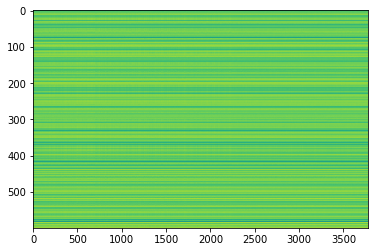

,AUC,pAUC
Source_0,0.654100,0.630526
Source_1,0.848400,0.655263
Source_2,0.688800,0.588421
Target_0,0.544700,0.524211
Target_1,0.699400,0.494737
Target_2,0.513600,0.517895
mean,0.658167,0.568509
h_mean,0.640204,0.562253


2021-05-30 23:00:24,012 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:307.440254, val_AUC_hmean:0.640204, val_pAUC_hmean:0.562253, best_flag:True
2021-05-30 23:00:24,013 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 21.23it/s]
2021-05-30 23:00:24,580 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.72it/s]
2021-05-30 23:00:24,625 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.87it/s]


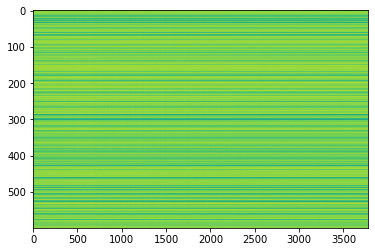

,AUC,pAUC
Source_0,0.675800,0.638421
Source_1,0.842100,0.648947
Source_2,0.718600,0.615789
Target_0,0.588300,0.529474
Target_1,0.703100,0.494737
Target_2,0.480000,0.514211
mean,0.667983,0.573596
h_mean,0.647651,0.566790


2021-05-30 23:00:26,123 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:303.859901, val_AUC_hmean:0.647651, val_pAUC_hmean:0.566790, best_flag:True
2021-05-30 23:00:26,124 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.87it/s]
2021-05-30 23:00:26,573 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.72it/s]
2021-05-30 23:00:26,611 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.15it/s]
2021-05-30 23:00:26,651 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:295.969841, val_AUC_hmean:0.643212, val_pAUC_hmean:0.566391, best_flag:False
2021-05-30 23:00:26,652 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.65it/s]
2021-05-30 23:00:27,089 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.23it/s]
2021-05-30 23:00:27,127 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.49it/s]
2021-05-30 23

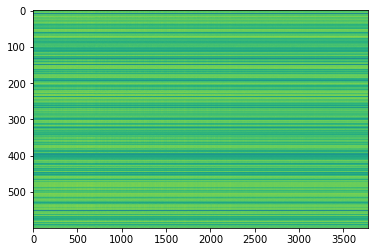

,AUC,pAUC
Source_0,0.651600,0.631579
Source_1,0.838500,0.664211
Source_2,0.682400,0.615263
Target_0,0.556300,0.546316
Target_1,0.696500,0.497368
Target_2,0.493100,0.501579
mean,0.653067,0.576053
h_mean,0.634650,0.568778


2021-05-30 23:00:32,218 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:275.283524, val_AUC_hmean:0.634650, val_pAUC_hmean:0.568778, best_flag:True
2021-05-30 23:00:32,219 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 23:00:32,660 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.96it/s]
2021-05-30 23:00:32,697 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.16it/s]


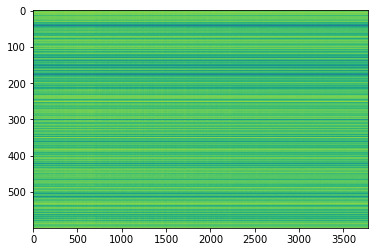

,AUC,pAUC
Source_0,0.665100,0.647368
Source_1,0.867500,0.686842
Source_2,0.724500,0.635263
Target_0,0.554000,0.531579
Target_1,0.713200,0.500000
Target_2,0.485900,0.505789
mean,0.668367,0.584474
h_mean,0.645040,0.575093


2021-05-30 23:00:34,181 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:270.041865, val_AUC_hmean:0.645040, val_pAUC_hmean:0.575093, best_flag:True
2021-05-30 23:00:34,182 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.42it/s]
2021-05-30 23:00:34,621 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.72it/s]
2021-05-30 23:00:34,659 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.12it/s]
2021-05-30 23:00:34,700 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:265.155492, val_AUC_hmean:0.645514, val_pAUC_hmean:0.559638, best_flag:False
2021-05-30 23:00:34,701 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.23it/s]
2021-05-30 23:00:35,143 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.44it/s]
2021-05-30 23:00:35,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.07it/s]
2021-05-30 23:0

100%|██████████| 2/2 [00:00<00:00, 106.19it/s]
2021-05-30 23:00:42,938 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.49it/s]
2021-05-30 23:00:42,978 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:230.117636, val_AUC_hmean:0.656026, val_pAUC_hmean:0.573415, best_flag:False
2021-05-30 23:00:42,979 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.55it/s]
2021-05-30 23:00:43,416 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.09it/s]
2021-05-30 23:00:43,452 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.66it/s]
2021-05-30 23:00:43,495 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:227.942047, val_AUC_hmean:0.652641, val_pAUC_hmean:0.563864, best_flag:False
2021-05-30 23:00:43,496 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.29it/s]
2021-05-30 23:00:43,937 - pytorch_modeler.py - INFO - valid_source
100%|████████

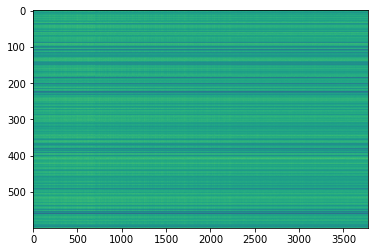

,AUC,pAUC
Source_0,0.666200,0.624211
Source_1,0.856800,0.650526
Source_2,0.703100,0.628947
Target_0,0.530800,0.542105
Target_1,0.654600,0.500000
Target_2,0.591300,0.560526
mean,0.667133,0.584386
h_mean,0.652653,0.579268


2021-05-30 23:00:45,429 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:225.813789, val_AUC_hmean:0.652653, val_pAUC_hmean:0.579268, best_flag:True
2021-05-30 23:00:45,430 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.53it/s]
2021-05-30 23:00:45,867 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.96it/s]
2021-05-30 23:00:45,903 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.92it/s]
2021-05-30 23:00:45,944 - pytorch_modeler.py - INFO - epoch:49/300, train_losses:221.913995, val_AUC_hmean:0.666849, val_pAUC_hmean:0.576306, best_flag:False
2021-05-30 23:00:45,945 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.17it/s]
2021-05-30 23:00:46,487 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.56it/s]
2021-05-30 23:00:46,526 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.02it/s]
2021-05-30 23:

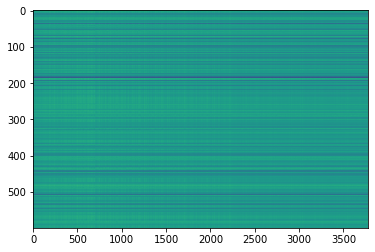

,AUC,pAUC
Source_0,0.657300,0.633684
Source_1,0.878400,0.687368
Source_2,0.710000,0.610526
Target_0,0.573700,0.540000
Target_1,0.674700,0.505789
Target_2,0.578500,0.543158
mean,0.678767,0.586754
h_mean,0.665035,0.580222


2021-05-30 23:00:55,243 - pytorch_modeler.py - INFO - epoch:64/300, train_losses:199.473942, val_AUC_hmean:0.665035, val_pAUC_hmean:0.580222, best_flag:True
2021-05-30 23:00:55,244 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.37it/s]
2021-05-30 23:00:55,684 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.32it/s]
2021-05-30 23:00:55,722 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.48it/s]
2021-05-30 23:00:55,763 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:197.647137, val_AUC_hmean:0.669395, val_pAUC_hmean:0.575912, best_flag:False
2021-05-30 23:00:55,764 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.44it/s]
2021-05-30 23:00:56,203 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.37it/s]
2021-05-30 23:00:56,239 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.35it/s]
2021-05-30 23:

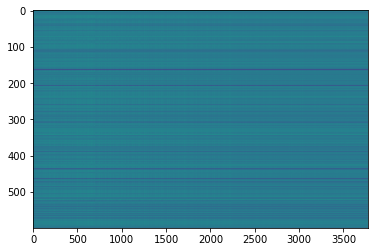

,AUC,pAUC
Source_0,0.677800,0.623158
Source_1,0.885800,0.695263
Source_2,0.728200,0.651579
Target_0,0.546700,0.530000
Target_1,0.673500,0.510526
Target_2,0.558300,0.538947
mean,0.678383,0.591579
h_mean,0.660602,0.583726


2021-05-30 23:00:58,718 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:191.162183, val_AUC_hmean:0.660602, val_pAUC_hmean:0.583726, best_flag:True
2021-05-30 23:00:58,719 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.05it/s]
2021-05-30 23:00:59,164 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.67it/s]
2021-05-30 23:00:59,203 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.67it/s]
2021-05-30 23:00:59,244 - pytorch_modeler.py - INFO - epoch:69/300, train_losses:189.172459, val_AUC_hmean:0.657783, val_pAUC_hmean:0.574395, best_flag:False
2021-05-30 23:00:59,245 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.28it/s]
2021-05-30 23:00:59,687 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.11it/s]
2021-05-30 23:00:59,725 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.61it/s]
2021-05-30 23

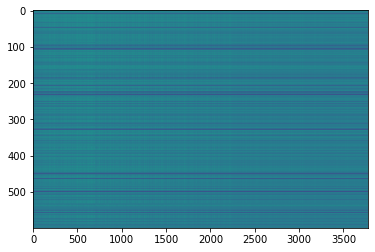

,AUC,pAUC
Source_0,0.694000,0.631053
Source_1,0.897900,0.721053
Source_2,0.722200,0.635263
Target_0,0.572300,0.531053
Target_1,0.653300,0.507368
Target_2,0.551300,0.536316
mean,0.681833,0.593684
h_mean,0.664363,0.584553


2021-05-30 23:01:04,379 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:179.435972, val_AUC_hmean:0.664363, val_pAUC_hmean:0.584553, best_flag:True
2021-05-30 23:01:04,380 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.23it/s]
2021-05-30 23:01:04,822 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.74it/s]
2021-05-30 23:01:04,860 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.87it/s]
2021-05-30 23:01:04,901 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:178.352460, val_AUC_hmean:0.673410, val_pAUC_hmean:0.583093, best_flag:False
2021-05-30 23:01:04,902 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.01it/s]
2021-05-30 23:01:05,348 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.63it/s]
2021-05-30 23:01:05,386 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.31it/s]
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 106.28it/s]
2021-05-30 23:01:13,190 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.27it/s]
2021-05-30 23:01:13,229 - pytorch_modeler.py - INFO - epoch:93/300, train_losses:157.332743, val_AUC_hmean:0.679130, val_pAUC_hmean:0.574026, best_flag:False
2021-05-30 23:01:13,230 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.34it/s]
2021-05-30 23:01:13,670 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.04it/s]
2021-05-30 23:01:13,708 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.52it/s]
2021-05-30 23:01:13,748 - pytorch_modeler.py - INFO - epoch:94/300, train_losses:156.856237, val_AUC_hmean:0.670069, val_pAUC_hmean:0.578487, best_flag:False
2021-05-30 23:01:13,748 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 23:01:14,187 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 23:01:21,649 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.18it/s]
2021-05-30 23:01:22,092 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.37it/s]
2021-05-30 23:01:22,131 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.64it/s]
2021-05-30 23:01:22,173 - pytorch_modeler.py - INFO - epoch:110/300, train_losses:139.943886, val_AUC_hmean:0.668889, val_pAUC_hmean:0.580407, best_flag:False
2021-05-30 23:01:22,174 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.39it/s]
2021-05-30 23:01:22,614 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.53it/s]
2021-05-30 23:01:22,651 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.67it/s]
2021-05-30 23:01:22,691 - pytorch_modeler.py - INFO - epoch:111/300, train_losses:138.498372, val_AUC_hmean:0.670724, val_pAUC_hmean:0.575837, best_flag:False
2021-05-30 

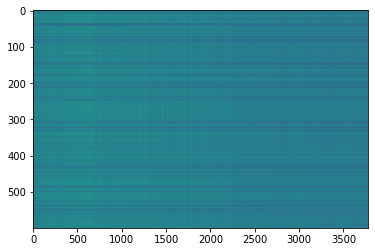

,AUC,pAUC
Source_0,0.680200,0.593684
Source_1,0.896400,0.751053
Source_2,0.710400,0.620000
Target_0,0.604600,0.580526
Target_1,0.641900,0.507368
Target_2,0.588200,0.532105
mean,0.686950,0.597456
h_mean,0.673752,0.588142


2021-05-30 23:01:29,315 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:127.898958, val_AUC_hmean:0.673752, val_pAUC_hmean:0.588142, best_flag:True
2021-05-30 23:01:29,316 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.78it/s]
2021-05-30 23:01:29,766 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.59it/s]
2021-05-30 23:01:29,804 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.99it/s]
2021-05-30 23:01:29,844 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:127.209763, val_AUC_hmean:0.659422, val_pAUC_hmean:0.574750, best_flag:False
2021-05-30 23:01:29,845 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.48it/s]
2021-05-30 23:01:30,284 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.77it/s]
2021-05-30 23:01:30,321 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.13it/s]
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 101.87it/s]
2021-05-30 23:01:38,226 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.02it/s]
2021-05-30 23:01:38,267 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:112.646782, val_AUC_hmean:0.669943, val_pAUC_hmean:0.565370, best_flag:False
2021-05-30 23:01:38,268 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.84it/s]
2021-05-30 23:01:38,717 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.64it/s]
2021-05-30 23:01:38,754 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.88it/s]
2021-05-30 23:01:38,793 - pytorch_modeler.py - INFO - epoch:139/300, train_losses:111.064391, val_AUC_hmean:0.659003, val_pAUC_hmean:0.579813, best_flag:False
2021-05-30 23:01:38,794 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.55it/s]
2021-05-30 23:01:39,231 - pytorch_modeler.py - INFO - valid_source
100%|█████

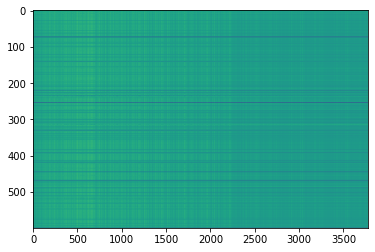

,AUC,pAUC
Source_0,0.717200,0.597368
Source_1,0.894100,0.719474
Source_2,0.707800,0.642105
Target_0,0.606800,0.564211
Target_1,0.680500,0.517895
Target_2,0.566000,0.540000
mean,0.695400,0.596842
h_mean,0.681055,0.589598


2021-05-30 23:01:46,989 - pytorch_modeler.py - INFO - epoch:152/300, train_losses:101.687534, val_AUC_hmean:0.681055, val_pAUC_hmean:0.589598, best_flag:True
2021-05-30 23:01:46,990 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.42it/s]
2021-05-30 23:01:47,430 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.29it/s]
2021-05-30 23:01:47,468 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.17it/s]
2021-05-30 23:01:47,508 - pytorch_modeler.py - INFO - epoch:153/300, train_losses:99.638920, val_AUC_hmean:0.673155, val_pAUC_hmean:0.580259, best_flag:False
2021-05-30 23:01:47,509 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 23:01:47,947 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.49it/s]
2021-05-30 23:01:47,985 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.05it/s]
2021-05-30 23

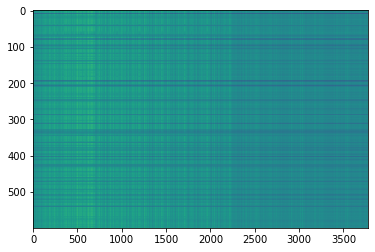

,AUC,pAUC
Source_0,0.668100,0.603684
Source_1,0.908400,0.765263
Source_2,0.751600,0.625789
Target_0,0.622300,0.573158
Target_1,0.650700,0.509474
Target_2,0.569500,0.544211
mean,0.695100,0.603596
h_mean,0.679672,0.593691


2021-05-30 23:01:56,302 - pytorch_modeler.py - INFO - epoch:167/300, train_losses:88.491639, val_AUC_hmean:0.679672, val_pAUC_hmean:0.593691, best_flag:True
2021-05-30 23:01:56,303 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 23:01:56,745 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.77it/s]
2021-05-30 23:01:56,782 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.84it/s]
2021-05-30 23:01:56,822 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:87.532115, val_AUC_hmean:0.664191, val_pAUC_hmean:0.578091, best_flag:False
2021-05-30 23:01:56,822 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.42it/s]
2021-05-30 23:01:57,262 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.96it/s]
2021-05-30 23:01:57,300 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.61it/s]
2021-05-30 23:

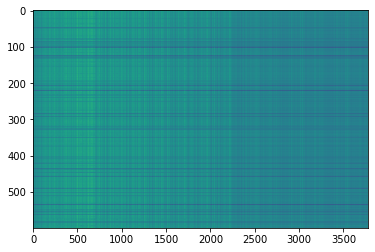

,AUC,pAUC
Source_0,0.714700,0.601579
Source_1,0.912800,0.767368
Source_2,0.719700,0.655789
Target_0,0.631700,0.553158
Target_1,0.695200,0.528947
Target_2,0.597100,0.522105
mean,0.711867,0.604825
h_mean,0.699267,0.593824


2021-05-30 23:02:03,975 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:79.816595, val_AUC_hmean:0.699267, val_pAUC_hmean:0.593824, best_flag:True
2021-05-30 23:02:03,976 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.14it/s]
2021-05-30 23:02:04,420 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.55it/s]
2021-05-30 23:02:04,457 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.29it/s]
2021-05-30 23:02:04,498 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:78.727260, val_AUC_hmean:0.681102, val_pAUC_hmean:0.582213, best_flag:False
2021-05-30 23:02:04,499 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.08it/s]
2021-05-30 23:02:04,944 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.02it/s]
2021-05-30 23:02:04,982 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.73it/s]
2021-05-30 23:

100%|██████████| 2/2 [00:00<00:00, 97.09it/s]
2021-05-30 23:02:13,032 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.11it/s]
2021-05-30 23:02:13,074 - pytorch_modeler.py - INFO - epoch:196/300, train_losses:68.359924, val_AUC_hmean:0.684689, val_pAUC_hmean:0.588208, best_flag:False
2021-05-30 23:02:13,075 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.80it/s]
2021-05-30 23:02:13,524 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.22it/s]
2021-05-30 23:02:13,566 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.34it/s]
2021-05-30 23:02:13,612 - pytorch_modeler.py - INFO - epoch:197/300, train_losses:67.883778, val_AUC_hmean:0.662562, val_pAUC_hmean:0.579288, best_flag:False
2021-05-30 23:02:13,614 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.03it/s]
2021-05-30 23:02:14,060 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

2021-05-30 23:02:21,488 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.09it/s]
2021-05-30 23:02:21,933 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.97it/s]
2021-05-30 23:02:21,971 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.19it/s]
2021-05-30 23:02:22,013 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:58.847275, val_AUC_hmean:0.671934, val_pAUC_hmean:0.581231, best_flag:False
2021-05-30 23:02:22,014 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.05it/s]
2021-05-30 23:02:22,459 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.66it/s]
2021-05-30 23:02:22,496 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.78it/s]
2021-05-30 23:02:22,538 - pytorch_modeler.py - INFO - epoch:214/300, train_losses:58.117777, val_AUC_hmean:0.665552, val_pAUC_hmean:0.582193, best_flag:False
2021-05-30 23:

100%|██████████| 2/2 [00:00<00:00, 101.68it/s]
2021-05-30 23:02:30,495 - pytorch_modeler.py - INFO - epoch:229/300, train_losses:49.793564, val_AUC_hmean:0.671007, val_pAUC_hmean:0.582841, best_flag:False
2021-05-30 23:02:30,496 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 23:02:30,936 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.25it/s]
2021-05-30 23:02:30,974 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.30it/s]
2021-05-30 23:02:31,013 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:50.155617, val_AUC_hmean:0.681749, val_pAUC_hmean:0.591134, best_flag:False
2021-05-30 23:02:31,014 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.23it/s]
2021-05-30 23:02:31,456 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.43it/s]
2021-05-30 23:02:31,494 - pytorch_modeler.py - INFO - valid_target
100%|███████

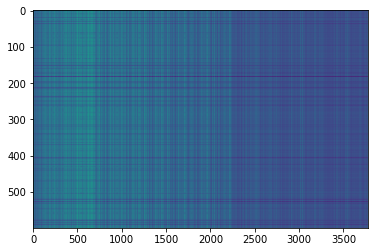

,AUC,pAUC
Source_0,0.681300,0.610526
Source_1,0.893500,0.769474
Source_2,0.700200,0.640000
Target_0,0.650700,0.582632
Target_1,0.580200,0.493158
Target_2,0.564100,0.542105
mean,0.678333,0.606316
h_mean,0.663113,0.594720


2021-05-30 23:02:38,147 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:53.034965, val_AUC_hmean:0.663113, val_pAUC_hmean:0.594720, best_flag:True
2021-05-30 23:02:38,148 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.52it/s]
2021-05-30 23:02:38,586 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.04it/s]
2021-05-30 23:02:38,625 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.54it/s]
2021-05-30 23:02:38,666 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:49.230920, val_AUC_hmean:0.672060, val_pAUC_hmean:0.593977, best_flag:False
2021-05-30 23:02:38,667 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.37it/s]
2021-05-30 23:02:39,107 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.95it/s]
2021-05-30 23:02:39,145 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.96it/s]
2021-05-30 23

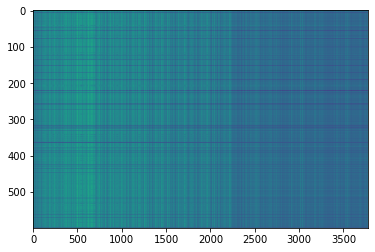

,AUC,pAUC
Source_0,0.715600,0.611579
Source_1,0.912700,0.745263
Source_2,0.714300,0.622105
Target_0,0.623400,0.588421
Target_1,0.670200,0.531053
Target_2,0.574500,0.527368
mean,0.701783,0.604298
h_mean,0.687294,0.596238


2021-05-30 23:02:43,299 - pytorch_modeler.py - INFO - epoch:248/300, train_losses:42.372843, val_AUC_hmean:0.687294, val_pAUC_hmean:0.596238, best_flag:True
2021-05-30 23:02:43,300 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.47it/s]
2021-05-30 23:02:43,738 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.71it/s]
2021-05-30 23:02:43,777 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.31it/s]


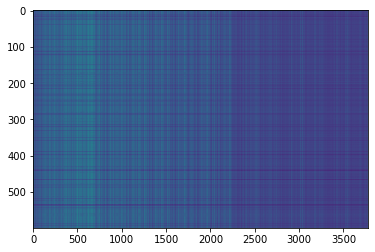

,AUC,pAUC
Source_0,0.694200,0.597368
Source_1,0.911700,0.776842
Source_2,0.715300,0.640000
Target_0,0.631100,0.592105
Target_1,0.664100,0.514737
Target_2,0.558800,0.526842
mean,0.695867,0.607982
h_mean,0.680638,0.596807


2021-05-30 23:02:45,273 - pytorch_modeler.py - INFO - epoch:249/300, train_losses:41.857433, val_AUC_hmean:0.680638, val_pAUC_hmean:0.596807, best_flag:True
2021-05-30 23:02:45,274 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.44it/s]
2021-05-30 23:02:45,713 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.50it/s]
2021-05-30 23:02:45,750 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.90it/s]
2021-05-30 23:02:45,790 - pytorch_modeler.py - INFO - epoch:250/300, train_losses:41.217755, val_AUC_hmean:0.679791, val_pAUC_hmean:0.590800, best_flag:False
2021-05-30 23:02:45,791 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.63it/s]
2021-05-30 23:02:46,227 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.70it/s]
2021-05-30 23:02:46,263 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.04it/s]
2021-05-30 23:

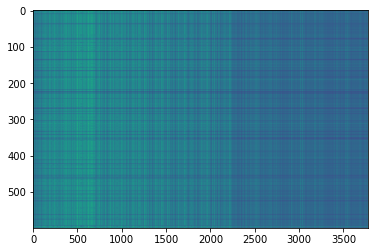

,AUC,pAUC
Source_0,0.714300,0.595789
Source_1,0.913500,0.778421
Source_2,0.722000,0.644737
Target_0,0.636400,0.590000
Target_1,0.671600,0.541579
Target_2,0.585500,0.527368
mean,0.707217,0.612982
h_mean,0.693805,0.602912


2021-05-30 23:02:49,278 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:39.343525, val_AUC_hmean:0.693805, val_pAUC_hmean:0.602912, best_flag:True
2021-05-30 23:02:49,278 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.17it/s]
2021-05-30 23:02:49,722 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.51it/s]
2021-05-30 23:02:49,758 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.09it/s]
2021-05-30 23:02:49,797 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:39.338026, val_AUC_hmean:0.682783, val_pAUC_hmean:0.591148, best_flag:False
2021-05-30 23:02:49,798 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.55it/s]
2021-05-30 23:02:50,236 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.32it/s]
2021-05-30 23:02:50,281 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.05it/s]
2021-05-30 23

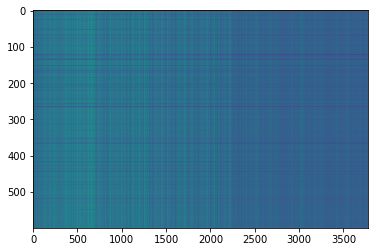

,AUC,pAUC
Source_0,0.715300,0.593684
Source_1,0.931300,0.784211
Source_2,0.716300,0.647368
Target_0,0.636900,0.573158
Target_1,0.709500,0.575789
Target_2,0.582400,0.527895
mean,0.715283,0.617018
h_mean,0.700572,0.607284


2021-05-30 23:02:52,273 - pytorch_modeler.py - INFO - epoch:257/300, train_losses:38.511553, val_AUC_hmean:0.700572, val_pAUC_hmean:0.607284, best_flag:True
2021-05-30 23:02:52,273 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.51it/s]
2021-05-30 23:02:52,711 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.67it/s]
2021-05-30 23:02:52,748 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.10it/s]
2021-05-30 23:02:52,787 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:37.784640, val_AUC_hmean:0.674085, val_pAUC_hmean:0.590136, best_flag:False
2021-05-30 23:02:52,788 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.63it/s]
2021-05-30 23:02:53,224 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 109.15it/s]
2021-05-30 23:02:53,260 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.02it/s]
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 106.18it/s]
2021-05-30 23:03:01,091 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.06it/s]
2021-05-30 23:03:01,132 - pytorch_modeler.py - INFO - epoch:274/300, train_losses:32.177028, val_AUC_hmean:0.682517, val_pAUC_hmean:0.591585, best_flag:False
2021-05-30 23:03:01,133 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.10it/s]
2021-05-30 23:03:01,577 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.35it/s]
2021-05-30 23:03:01,617 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.25it/s]
2021-05-30 23:03:01,658 - pytorch_modeler.py - INFO - epoch:275/300, train_losses:32.092596, val_AUC_hmean:0.675341, val_pAUC_hmean:0.593194, best_flag:False
2021-05-30 23:03:01,659 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.12it/s]
2021-05-30 23:03:02,103 - pytorch_modeler.py - INFO - valid_source
100%|███████

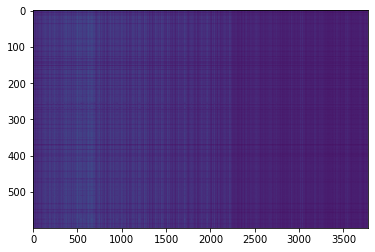

,AUC,pAUC
Source_0,0.720500,0.590526
Source_1,0.927100,0.783158
Source_2,0.702200,0.631579
Target_0,0.626600,0.582105
Target_1,0.698000,0.584211
Target_2,0.567000,0.527368
mean,0.706900,0.616491
h_mean,0.691013,0.607322


2021-05-30 23:03:05,247 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:30.259779, val_AUC_hmean:0.691013, val_pAUC_hmean:0.607322, best_flag:True
2021-05-30 23:03:05,248 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.01it/s]
2021-05-30 23:03:05,694 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.69it/s]
2021-05-30 23:03:05,732 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.37it/s]
2021-05-30 23:03:05,773 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:30.134246, val_AUC_hmean:0.681961, val_pAUC_hmean:0.599073, best_flag:False
2021-05-30 23:03:05,774 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.38it/s]
2021-05-30 23:03:06,214 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.74it/s]
2021-05-30 23:03:06,251 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.11it/s]
2021-05-30 23:

100%|██████████| 2/2 [00:00<00:00, 104.61it/s]
2021-05-30 23:03:14,062 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.89it/s]
2021-05-30 23:03:14,104 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:25.255038, val_AUC_hmean:0.687829, val_pAUC_hmean:0.595156, best_flag:False
2021-05-30 23:03:14,105 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 23:03:14,545 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.19it/s]
2021-05-30 23:03:14,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.76it/s]
2021-05-30 23:03:14,624 - pytorch_modeler.py - INFO - epoch:297/300, train_losses:25.532078, val_AUC_hmean:0.681664, val_pAUC_hmean:0.595575, best_flag:False
2021-05-30 23:03:14,625 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.59it/s]
2021-05-30 23:03:15,062 - pytorch_modeler.py - INFO - valid_source
100%|████████

,AUC,pAUC
Source_0,0.720500,0.590526
Source_1,0.927100,0.783158
Source_2,0.702200,0.631579
Target_0,0.626600,0.582105
Target_1,0.698000,0.584211
Target_2,0.567000,0.527368
mean,0.706900,0.616491
h_mean,0.691013,0.607322


2021-05-30 23:03:16,186 - 00_train.py - INFO - TARGET MACHINE_TYPE: fan
2021-05-30 23:03:16,187 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 23:03:16,232 - 00_train.py - INFO - TRAINING


elapsed time: 200.680356264 [sec]


2021-05-30 23:03:16,594 - pytorch_modeler.py - INFO - train
 25%|██▌       | 3/12 [00:00<00:00, 27.21it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 27.52it/s]
2021-05-30 23:03:17,032 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.26it/s]
2021-05-30 23:03:17,068 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.64it/s]


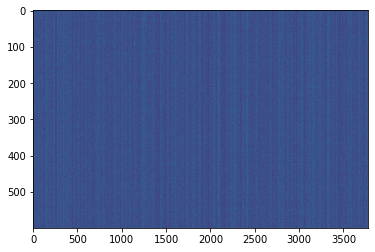

,AUC,pAUC
Source_0,0.481650,0.491579
Source_1,0.411700,0.513684
Source_2,0.454600,0.514211
Target_0,0.645000,0.521053
Target_1,0.529900,0.533158
Target_2,0.410700,0.482105
mean,0.488925,0.509298
h_mean,0.477050,0.508701


2021-05-30 23:03:18,500 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:961.717667, val_AUC_hmean:0.477050, val_pAUC_hmean:0.508701, best_flag:True
2021-05-30 23:03:18,501 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 23:03:18,941 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.71it/s]
2021-05-30 23:03:18,979 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.46it/s]
2021-05-30 23:03:19,019 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:706.414500, val_AUC_hmean:0.509620, val_pAUC_hmean:0.507924, best_flag:False
2021-05-30 23:03:19,020 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.03it/s]
2021-05-30 23:03:19,566 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.51it/s]
2021-05-30 23:03:19,604 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.57it/s]


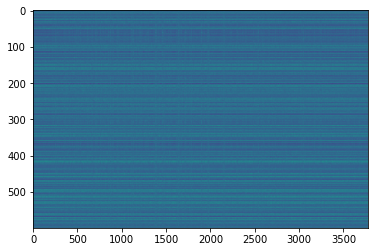

,AUC,pAUC
Source_0,0.578300,0.518947
Source_1,0.380900,0.510526
Source_2,0.599600,0.515263
Target_0,0.660800,0.537368
Target_1,0.480300,0.484737
Target_2,0.557200,0.522632
mean,0.542850,0.514912
h_mean,0.525745,0.514413


2021-05-30 23:03:21,040 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:565.312953, val_AUC_hmean:0.525745, val_pAUC_hmean:0.514413, best_flag:True
2021-05-30 23:03:21,041 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.37it/s]
2021-05-30 23:03:21,481 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.74it/s]
2021-05-30 23:03:21,519 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.97it/s]
2021-05-30 23:03:21,558 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:477.419858, val_AUC_hmean:0.573491, val_pAUC_hmean:0.505208, best_flag:False
2021-05-30 23:03:21,559 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.32it/s]
2021-05-30 23:03:22,001 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.70it/s]
2021-05-30 23:03:22,038 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.52it/s]


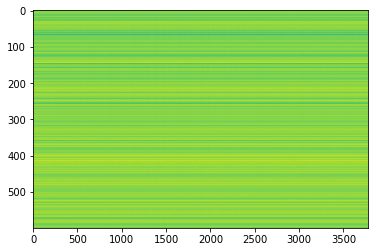

,AUC,pAUC
Source_0,0.655500,0.518947
Source_1,0.616000,0.525789
Source_2,0.631900,0.523158
Target_0,0.643400,0.501053
Target_1,0.564400,0.505789
Target_2,0.562600,0.522105
mean,0.612300,0.516140
h_mean,0.610069,0.515970


2021-05-30 23:03:23,460 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:421.781570, val_AUC_hmean:0.610069, val_pAUC_hmean:0.515970, best_flag:True
2021-05-30 23:03:23,460 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.75it/s]
2021-05-30 23:03:23,911 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.01it/s]
2021-05-30 23:03:23,949 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.37it/s]


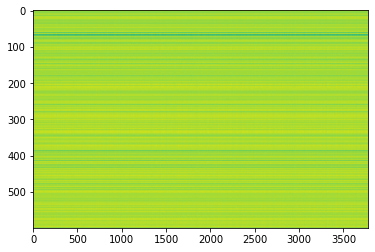

,AUC,pAUC
Source_0,0.702800,0.600000
Source_1,0.658400,0.561053
Source_2,0.602600,0.506842
Target_0,0.704100,0.564211
Target_1,0.607200,0.517895
Target_2,0.569400,0.515789
mean,0.640750,0.544298
h_mean,0.636633,0.542295


2021-05-30 23:03:25,371 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:385.425242, val_AUC_hmean:0.636633, val_pAUC_hmean:0.542295, best_flag:True
2021-05-30 23:03:25,372 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.51it/s]
2021-05-30 23:03:25,811 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.58it/s]
2021-05-30 23:03:25,847 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.80it/s]


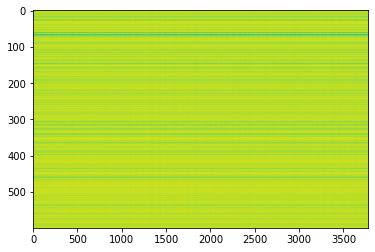

,AUC,pAUC
Source_0,0.70040,0.599474
Source_1,0.66500,0.562632
Source_2,0.60370,0.530000
Target_0,0.71520,0.568421
Target_1,0.55870,0.507895
Target_2,0.58230,0.523684
mean,0.63755,0.548684
h_mean,0.63202,0.546946


2021-05-30 23:03:27,273 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:364.137998, val_AUC_hmean:0.632020, val_pAUC_hmean:0.546946, best_flag:True
2021-05-30 23:03:27,274 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.19it/s]
2021-05-30 23:03:27,717 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.94it/s]
2021-05-30 23:03:27,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.92it/s]
2021-05-30 23:03:27,796 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:348.903315, val_AUC_hmean:0.642603, val_pAUC_hmean:0.546504, best_flag:False
2021-05-30 23:03:27,797 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.32it/s]
2021-05-30 23:03:28,239 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.01it/s]
2021-05-30 23:03:28,276 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.08it/s]
2021-05-30 23:03

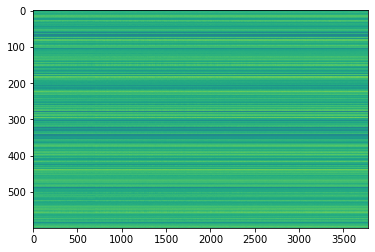

,AUC,pAUC
Source_0,0.741500,0.575789
Source_1,0.699500,0.578947
Source_2,0.538400,0.501579
Target_0,0.778200,0.623684
Target_1,0.614200,0.516316
Target_2,0.502500,0.522632
mean,0.645717,0.553158
h_mean,0.629012,0.549889


2021-05-30 23:03:30,741 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:317.738510, val_AUC_hmean:0.629012, val_pAUC_hmean:0.549889, best_flag:True
2021-05-30 23:03:30,741 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.56it/s]
2021-05-30 23:03:31,179 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.42it/s]
2021-05-30 23:03:31,215 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.64it/s]
2021-05-30 23:03:31,255 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:311.651288, val_AUC_hmean:0.613843, val_pAUC_hmean:0.534262, best_flag:False
2021-05-30 23:03:31,256 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.54it/s]
2021-05-30 23:03:31,694 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.46it/s]
2021-05-30 23:03:31,733 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.26it/s]
2021-05-30 23:

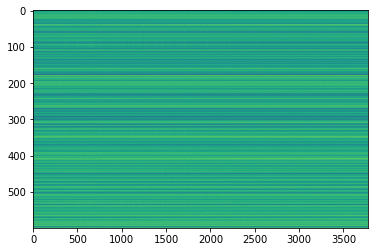

,AUC,pAUC
Source_0,0.690500,0.558947
Source_1,0.716800,0.581053
Source_2,0.664700,0.496842
Target_0,0.723900,0.618421
Target_1,0.649400,0.552632
Target_2,0.542100,0.513684
mean,0.664567,0.553596
h_mean,0.658348,0.550657


2021-05-30 23:03:33,754 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:297.992643, val_AUC_hmean:0.658348, val_pAUC_hmean:0.550657, best_flag:True
2021-05-30 23:03:33,756 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.56it/s]
2021-05-30 23:03:34,209 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.86it/s]
2021-05-30 23:03:34,247 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.99it/s]
2021-05-30 23:03:34,286 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:293.139661, val_AUC_hmean:0.605404, val_pAUC_hmean:0.541717, best_flag:False
2021-05-30 23:03:34,287 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.13it/s]
2021-05-30 23:03:34,731 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.10it/s]
2021-05-30 23:03:34,769 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.38it/s]


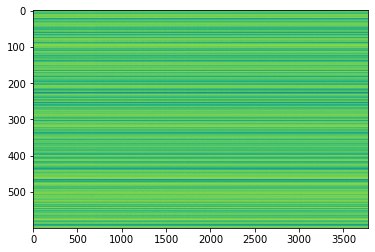

,AUC,pAUC
Source_0,0.696800,0.573158
Source_1,0.718900,0.606842
Source_2,0.502600,0.478947
Target_0,0.773700,0.635789
Target_1,0.613200,0.550000
Target_2,0.537300,0.512632
mean,0.640417,0.559561
h_mean,0.624985,0.554413


2021-05-30 23:03:36,321 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:287.453977, val_AUC_hmean:0.624985, val_pAUC_hmean:0.554413, best_flag:True
2021-05-30 23:03:36,322 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.44it/s]
2021-05-30 23:03:36,761 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.89it/s]
2021-05-30 23:03:36,798 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.12it/s]
2021-05-30 23:03:36,838 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:285.164436, val_AUC_hmean:0.648996, val_pAUC_hmean:0.553390, best_flag:False
2021-05-30 23:03:36,839 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.56it/s]
2021-05-30 23:03:37,276 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.67it/s]
2021-05-30 23:03:37,314 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.79it/s]
2021-05-30 23

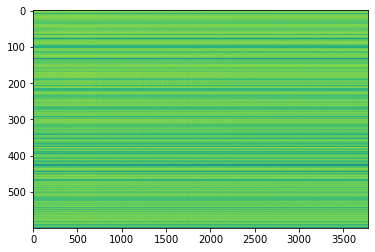

,AUC,pAUC
Source_0,0.649900,0.568421
Source_1,0.773900,0.637895
Source_2,0.628600,0.525789
Target_0,0.754500,0.584211
Target_1,0.665900,0.537895
Target_2,0.535300,0.510526
mean,0.668017,0.560789
h_mean,0.658118,0.557704


2021-05-30 23:03:40,809 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:267.089625, val_AUC_hmean:0.658118, val_pAUC_hmean:0.557704, best_flag:True
2021-05-30 23:03:40,809 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 21.52it/s]
2021-05-30 23:03:41,370 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.75it/s]
2021-05-30 23:03:41,408 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.76it/s]
2021-05-30 23:03:41,448 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:263.309817, val_AUC_hmean:0.640806, val_pAUC_hmean:0.555295, best_flag:False
2021-05-30 23:03:41,450 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.16it/s]
2021-05-30 23:03:41,893 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.92it/s]
2021-05-30 23:03:41,931 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.39it/s]
2021-05-30 23:

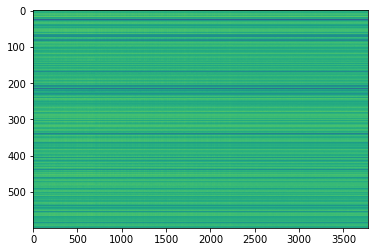

,AUC,pAUC
Source_0,0.749900,0.563684
Source_1,0.759000,0.628421
Source_2,0.586600,0.532632
Target_0,0.783700,0.597368
Target_1,0.652300,0.559474
Target_2,0.548300,0.503684
mean,0.679967,0.564211
h_mean,0.667510,0.561294


2021-05-30 23:03:47,622 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:238.254859, val_AUC_hmean:0.667510, val_pAUC_hmean:0.561294, best_flag:True
2021-05-30 23:03:47,623 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 23:03:48,064 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.31it/s]
2021-05-30 23:03:48,102 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.42it/s]
2021-05-30 23:03:48,143 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:236.662237, val_AUC_hmean:0.635644, val_pAUC_hmean:0.541108, best_flag:False
2021-05-30 23:03:48,144 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.47it/s]
2021-05-30 23:03:48,582 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.99it/s]
2021-05-30 23:03:48,620 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.11it/s]
2021-05-30 23:

100%|██████████| 2/2 [00:00<00:00, 100.90it/s]
2021-05-30 23:03:56,542 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.39it/s]
2021-05-30 23:03:56,583 - pytorch_modeler.py - INFO - epoch:49/300, train_losses:205.732920, val_AUC_hmean:0.670182, val_pAUC_hmean:0.549462, best_flag:False
2021-05-30 23:03:56,584 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.42it/s]
2021-05-30 23:03:57,023 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.64it/s]
2021-05-30 23:03:57,060 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.66it/s]
2021-05-30 23:03:57,099 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:205.931852, val_AUC_hmean:0.672797, val_pAUC_hmean:0.542768, best_flag:False
2021-05-30 23:03:57,100 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.12it/s]
2021-05-30 23:03:57,544 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 23:04:04,916 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.29it/s]
2021-05-30 23:04:05,358 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.59it/s]
2021-05-30 23:04:05,395 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.03it/s]
2021-05-30 23:04:05,435 - pytorch_modeler.py - INFO - epoch:66/300, train_losses:182.000272, val_AUC_hmean:0.647666, val_pAUC_hmean:0.534947, best_flag:False
2021-05-30 23:04:05,436 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 23:04:05,877 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.85it/s]
2021-05-30 23:04:05,913 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.52it/s]
2021-05-30 23:04:05,953 - pytorch_modeler.py - INFO - epoch:67/300, train_losses:179.820577, val_AUC_hmean:0.673305, val_pAUC_hmean:0.549019, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 104.56it/s]
2021-05-30 23:04:13,999 - pytorch_modeler.py - INFO - epoch:82/300, train_losses:160.987773, val_AUC_hmean:0.676256, val_pAUC_hmean:0.553773, best_flag:False
2021-05-30 23:04:14,000 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 23:04:14,442 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.82it/s]
2021-05-30 23:04:14,479 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.87it/s]
2021-05-30 23:04:14,520 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:159.482728, val_AUC_hmean:0.658743, val_pAUC_hmean:0.542786, best_flag:False
2021-05-30 23:04:14,521 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.01it/s]
2021-05-30 23:04:14,967 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.92it/s]
2021-05-30 23:04:15,003 - pytorch_modeler.py - INFO - valid_target
100%|███████

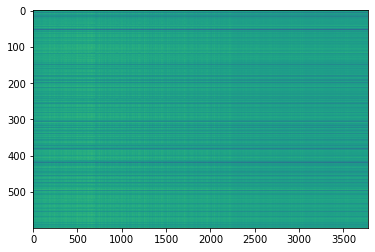

,AUC,pAUC
Source_0,0.662400,0.576316
Source_1,0.793200,0.661053
Source_2,0.660000,0.531579
Target_0,0.740200,0.580000
Target_1,0.681100,0.532632
Target_2,0.575900,0.514211
mean,0.685467,0.565965
h_mean,0.678645,0.562039


2021-05-30 23:04:20,095 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:149.786872, val_AUC_hmean:0.678645, val_pAUC_hmean:0.562039, best_flag:True
2021-05-30 23:04:20,096 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.03it/s]
2021-05-30 23:04:20,542 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.15it/s]
2021-05-30 23:04:20,580 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.04it/s]
2021-05-30 23:04:20,622 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:148.909847, val_AUC_hmean:0.658051, val_pAUC_hmean:0.549461, best_flag:False
2021-05-30 23:04:20,623 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.57it/s]
2021-05-30 23:04:21,060 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.61it/s]
2021-05-30 23:04:21,097 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.93it/s]
2021-05-30 23:

100%|██████████| 2/2 [00:00<00:00, 102.20it/s]
2021-05-30 23:04:28,996 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.53it/s]
2021-05-30 23:04:29,036 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:131.499994, val_AUC_hmean:0.677513, val_pAUC_hmean:0.551190, best_flag:False
2021-05-30 23:04:29,037 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.34it/s]
2021-05-30 23:04:29,478 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.57it/s]
2021-05-30 23:04:29,516 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.12it/s]
2021-05-30 23:04:29,556 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:130.583782, val_AUC_hmean:0.672887, val_pAUC_hmean:0.546101, best_flag:False
2021-05-30 23:04:29,557 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 23:04:29,999 - pytorch_modeler.py - INFO - valid_source
100%|█████

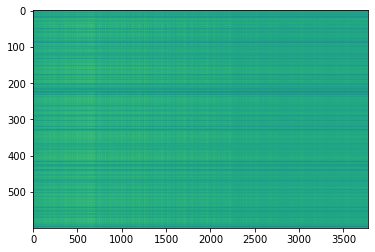

,AUC,pAUC
Source_0,0.691300,0.552105
Source_1,0.750700,0.659474
Source_2,0.658000,0.535263
Target_0,0.772500,0.607368
Target_1,0.695500,0.561579
Target_2,0.556300,0.505789
mean,0.687383,0.570263
h_mean,0.679632,0.566033


2021-05-30 23:04:35,669 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:121.199472, val_AUC_hmean:0.679632, val_pAUC_hmean:0.566033, best_flag:True
2021-05-30 23:04:35,669 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 23:04:36,109 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.62it/s]
2021-05-30 23:04:36,146 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.59it/s]
2021-05-30 23:04:36,187 - pytorch_modeler.py - INFO - epoch:119/300, train_losses:119.774169, val_AUC_hmean:0.651543, val_pAUC_hmean:0.533919, best_flag:False
2021-05-30 23:04:36,188 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.17it/s]
2021-05-30 23:04:36,631 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.16it/s]
2021-05-30 23:04:36,670 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.53it/s]
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 98.84it/s]
2021-05-30 23:04:44,472 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.55it/s]
2021-05-30 23:04:44,514 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:104.656702, val_AUC_hmean:0.661514, val_pAUC_hmean:0.552997, best_flag:False
2021-05-30 23:04:44,516 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.07it/s]
2021-05-30 23:04:44,961 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.87it/s]
2021-05-30 23:04:44,999 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.05it/s]
2021-05-30 23:04:45,039 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:105.193370, val_AUC_hmean:0.681112, val_pAUC_hmean:0.536308, best_flag:False
2021-05-30 23:04:45,041 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.16it/s]
2021-05-30 23:04:45,484 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 23:04:52,979 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.49it/s]
2021-05-30 23:04:53,417 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.19it/s]
2021-05-30 23:04:53,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.56it/s]
2021-05-30 23:04:53,495 - pytorch_modeler.py - INFO - epoch:152/300, train_losses:90.767918, val_AUC_hmean:0.671619, val_pAUC_hmean:0.546317, best_flag:False
2021-05-30 23:04:53,496 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 23:04:53,935 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.87it/s]
2021-05-30 23:04:53,973 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.63it/s]
2021-05-30 23:04:54,013 - pytorch_modeler.py - INFO - epoch:153/300, train_losses:90.156608, val_AUC_hmean:0.671153, val_pAUC_hmean:0.552893, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 102.33it/s]
2021-05-30 23:05:01,818 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:78.899677, val_AUC_hmean:0.676557, val_pAUC_hmean:0.547450, best_flag:False
2021-05-30 23:05:01,819 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.35it/s]
2021-05-30 23:05:02,259 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.31it/s]
2021-05-30 23:05:02,296 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.88it/s]
2021-05-30 23:05:02,336 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:78.038490, val_AUC_hmean:0.670531, val_pAUC_hmean:0.546953, best_flag:False
2021-05-30 23:05:02,337 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.41it/s]
2021-05-30 23:05:02,776 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.78it/s]
2021-05-30 23:05:02,814 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 26.44it/s]
2021-05-30 23:05:10,768 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.09it/s]
2021-05-30 23:05:10,806 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.70it/s]
2021-05-30 23:05:10,847 - pytorch_modeler.py - INFO - epoch:185/300, train_losses:67.552237, val_AUC_hmean:0.677335, val_pAUC_hmean:0.550674, best_flag:False
2021-05-30 23:05:10,848 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.19it/s]
2021-05-30 23:05:11,291 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.25it/s]
2021-05-30 23:05:11,329 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.63it/s]
2021-05-30 23:05:11,371 - pytorch_modeler.py - INFO - epoch:186/300, train_losses:66.897631, val_AUC_hmean:0.707151, val_pAUC_hmean:0.558724, best_flag:False
2021-05-30 23:05:11,372 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 23:05:19,216 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.19it/s]
2021-05-30 23:05:19,660 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.49it/s]
2021-05-30 23:05:19,698 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.01it/s]
2021-05-30 23:05:19,739 - pytorch_modeler.py - INFO - epoch:202/300, train_losses:58.044147, val_AUC_hmean:0.680610, val_pAUC_hmean:0.561855, best_flag:False
2021-05-30 23:05:19,740 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.05it/s]
2021-05-30 23:05:20,186 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.92it/s]
2021-05-30 23:05:20,224 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.10it/s]
2021-05-30 23:05:20,265 - pytorch_modeler.py - INFO - epoch:203/300, train_losses:59.805637, val_AUC_hmean:0.605131, val_pAUC_hmean:0.516201, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 101.63it/s]
2021-05-30 23:05:28,216 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:48.375614, val_AUC_hmean:0.686801, val_pAUC_hmean:0.561258, best_flag:False
2021-05-30 23:05:28,217 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 23:05:28,658 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.95it/s]
2021-05-30 23:05:28,697 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.18it/s]
2021-05-30 23:05:28,737 - pytorch_modeler.py - INFO - epoch:219/300, train_losses:48.305664, val_AUC_hmean:0.687146, val_pAUC_hmean:0.559401, best_flag:False
2021-05-30 23:05:28,738 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 23:05:29,178 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.51it/s]
2021-05-30 23:05:29,215 - pytorch_modeler.py - INFO - valid_target
100%|████████

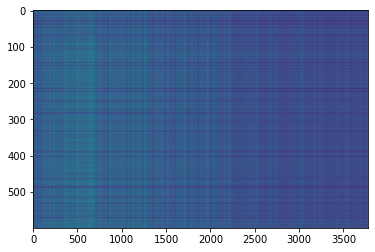

,AUC,pAUC
Source_0,0.634000,0.518421
Source_1,0.782900,0.703684
Source_2,0.679700,0.558421
Target_0,0.707800,0.551579
Target_1,0.725500,0.544737
Target_2,0.627500,0.555263
mean,0.692900,0.572018
h_mean,0.688813,0.566547


2021-05-30 23:05:34,295 - pytorch_modeler.py - INFO - epoch:227/300, train_losses:44.449577, val_AUC_hmean:0.688813, val_pAUC_hmean:0.566547, best_flag:True
2021-05-30 23:05:34,295 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.26it/s]
2021-05-30 23:05:34,737 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.70it/s]
2021-05-30 23:05:34,776 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.95it/s]
2021-05-30 23:05:34,817 - pytorch_modeler.py - INFO - epoch:228/300, train_losses:44.235052, val_AUC_hmean:0.689287, val_pAUC_hmean:0.561764, best_flag:False
2021-05-30 23:05:34,818 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.41it/s]
2021-05-30 23:05:35,257 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.89it/s]
2021-05-30 23:05:35,296 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.91it/s]
2021-05-30 23

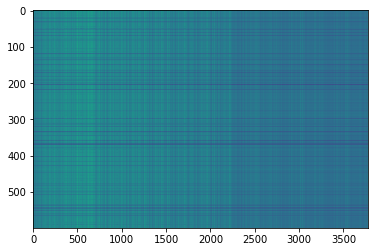

,AUC,pAUC
Source_0,0.614400,0.524211
Source_1,0.781400,0.699474
Source_2,0.691600,0.565263
Target_0,0.684800,0.573158
Target_1,0.737300,0.556842
Target_2,0.601200,0.521579
mean,0.685117,0.573421
h_mean,0.679255,0.567957


2021-05-30 23:05:39,865 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:41.305916, val_AUC_hmean:0.679255, val_pAUC_hmean:0.567957, best_flag:True
2021-05-30 23:05:39,866 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.48it/s]
2021-05-30 23:05:40,305 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.15it/s]
2021-05-30 23:05:40,342 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.23it/s]
2021-05-30 23:05:40,382 - pytorch_modeler.py - INFO - epoch:236/300, train_losses:40.684539, val_AUC_hmean:0.684090, val_pAUC_hmean:0.563738, best_flag:False
2021-05-30 23:05:40,383 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.10it/s]
2021-05-30 23:05:40,928 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.15it/s]
2021-05-30 23:05:40,967 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.84it/s]
2021-05-30 23:

100%|██████████| 2/2 [00:00<00:00, 101.89it/s]
2021-05-30 23:05:48,795 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.48it/s]
2021-05-30 23:05:48,835 - pytorch_modeler.py - INFO - epoch:252/300, train_losses:34.310332, val_AUC_hmean:0.693692, val_pAUC_hmean:0.562965, best_flag:False
2021-05-30 23:05:48,836 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 23:05:49,276 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.74it/s]
2021-05-30 23:05:49,314 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.95it/s]
2021-05-30 23:05:49,354 - pytorch_modeler.py - INFO - epoch:253/300, train_losses:33.654647, val_AUC_hmean:0.692885, val_pAUC_hmean:0.559619, best_flag:False
2021-05-30 23:05:49,355 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.20it/s]
2021-05-30 23:05:49,798 - pytorch_modeler.py - INFO - valid_source
100%|███████

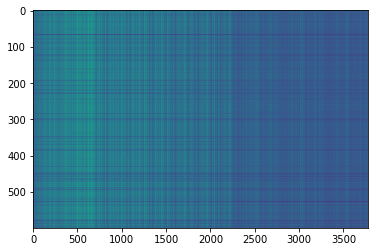

,AUC,pAUC
Source_0,0.66350,0.522632
Source_1,0.78730,0.715789
Source_2,0.69650,0.571579
Target_0,0.71490,0.546316
Target_1,0.74150,0.550526
Target_2,0.61430,0.538421
mean,0.70300,0.574211
h_mean,0.69862,0.567958


2021-05-30 23:05:52,837 - pytorch_modeler.py - INFO - epoch:257/300, train_losses:31.851628, val_AUC_hmean:0.698620, val_pAUC_hmean:0.567958, best_flag:True
2021-05-30 23:05:52,838 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.38it/s]
2021-05-30 23:05:53,278 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.19it/s]
2021-05-30 23:05:53,316 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.35it/s]
2021-05-30 23:05:53,356 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:31.417790, val_AUC_hmean:0.686635, val_pAUC_hmean:0.556878, best_flag:False
2021-05-30 23:05:53,357 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.54it/s]
2021-05-30 23:05:53,795 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.20it/s]
2021-05-30 23:05:53,831 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.93it/s]
2021-05-30 23:

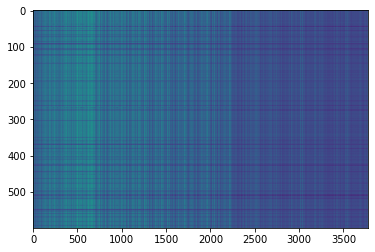

,AUC,pAUC
Source_0,0.695100,0.513158
Source_1,0.801300,0.698421
Source_2,0.693300,0.573158
Target_0,0.726900,0.556842
Target_1,0.736400,0.538947
Target_2,0.632800,0.559474
mean,0.714300,0.573333
h_mean,0.710654,0.567970


2021-05-30 23:05:56,324 - pytorch_modeler.py - INFO - epoch:261/300, train_losses:31.565090, val_AUC_hmean:0.710654, val_pAUC_hmean:0.567970, best_flag:True
2021-05-30 23:05:56,325 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.99it/s]
2021-05-30 23:05:56,772 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.73it/s]
2021-05-30 23:05:56,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.40it/s]
2021-05-30 23:05:56,852 - pytorch_modeler.py - INFO - epoch:262/300, train_losses:30.623333, val_AUC_hmean:0.696964, val_pAUC_hmean:0.567432, best_flag:False
2021-05-30 23:05:56,853 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 23:05:57,291 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.39it/s]
2021-05-30 23:05:57,329 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.30it/s]
2021-05-30 23

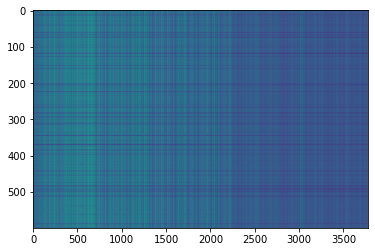

,AUC,pAUC
Source_0,0.705800,0.507895
Source_1,0.800600,0.702105
Source_2,0.682800,0.564737
Target_0,0.745500,0.586316
Target_1,0.740000,0.561579
Target_2,0.626200,0.543158
mean,0.716817,0.577632
h_mean,0.712579,0.571904


2021-05-30 23:05:59,395 - pytorch_modeler.py - INFO - epoch:264/300, train_losses:29.707952, val_AUC_hmean:0.712579, val_pAUC_hmean:0.571904, best_flag:True
2021-05-30 23:05:59,396 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.21it/s]
2021-05-30 23:05:59,838 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.97it/s]
2021-05-30 23:05:59,876 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.24it/s]
2021-05-30 23:05:59,917 - pytorch_modeler.py - INFO - epoch:265/300, train_losses:29.405621, val_AUC_hmean:0.699465, val_pAUC_hmean:0.570608, best_flag:False
2021-05-30 23:05:59,918 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 23:06:00,358 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.86it/s]
2021-05-30 23:06:00,395 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.49it/s]
2021-05-30 23

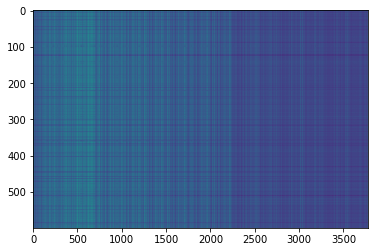

,AUC,pAUC
Source_0,0.687100,0.514737
Source_1,0.797200,0.707368
Source_2,0.645300,0.542632
Target_0,0.751900,0.577895
Target_1,0.740300,0.557368
Target_2,0.623900,0.572105
mean,0.707617,0.578684
h_mean,0.702326,0.572968


2021-05-30 23:06:08,185 - pytorch_modeler.py - INFO - epoch:278/300, train_losses:25.141171, val_AUC_hmean:0.702326, val_pAUC_hmean:0.572968, best_flag:True
2021-05-30 23:06:08,186 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 23:06:08,627 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.30it/s]
2021-05-30 23:06:08,666 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.38it/s]
2021-05-30 23:06:08,706 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:25.806633, val_AUC_hmean:0.702364, val_pAUC_hmean:0.565020, best_flag:False
2021-05-30 23:06:08,707 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 23:06:09,147 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.49it/s]
2021-05-30 23:06:09,184 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.53it/s]
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 104.55it/s]
2021-05-30 23:06:16,986 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.63it/s]
2021-05-30 23:06:17,027 - pytorch_modeler.py - INFO - epoch:295/300, train_losses:21.071088, val_AUC_hmean:0.694075, val_pAUC_hmean:0.554698, best_flag:False
2021-05-30 23:06:17,028 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.02it/s]
2021-05-30 23:06:17,575 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.52it/s]
2021-05-30 23:06:17,614 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.90it/s]
2021-05-30 23:06:17,657 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:20.894379, val_AUC_hmean:0.682952, val_pAUC_hmean:0.565098, best_flag:False
2021-05-30 23:06:17,658 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.12it/s]
2021-05-30 23:06:18,102 - pytorch_modeler.py - INFO - valid_source
100%|████████

,AUC,pAUC
Source_0,0.687100,0.514737
Source_1,0.797200,0.707368
Source_2,0.645300,0.542632
Target_0,0.751900,0.577895
Target_1,0.740300,0.557368
Target_2,0.623900,0.572105
mean,0.707617,0.578684
h_mean,0.702326,0.572968


2021-05-30 23:06:19,751 - 00_train.py - INFO - TARGET MACHINE_TYPE: slider
2021-05-30 23:06:19,751 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 23:06:19,793 - 00_train.py - INFO - TRAINING


elapsed time: 183.561610222 [sec]


2021-05-30 23:06:20,157 - pytorch_modeler.py - INFO - train
 25%|██▌       | 3/12 [00:00<00:00, 27.65it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 23:06:20,596 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.91it/s]
2021-05-30 23:06:20,634 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.47it/s]


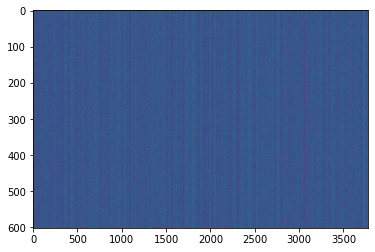

,AUC,pAUC
Source_0,0.553500,0.543158
Source_1,0.429200,0.476842
Source_2,0.554991,0.506051
Target_0,0.471400,0.497368
Target_1,0.455612,0.502793
Target_2,0.560938,0.505858
mean,0.504274,0.505345
h_mean,0.498449,0.504600


2021-05-30 23:06:22,069 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:918.210958, val_AUC_hmean:0.498449, val_pAUC_hmean:0.504600, best_flag:True
2021-05-30 23:06:22,070 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.35it/s]
2021-05-30 23:06:22,510 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.99it/s]
2021-05-30 23:06:22,547 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.66it/s]


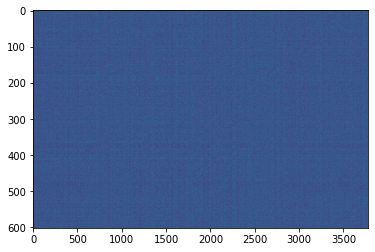

,AUC,pAUC
Source_0,0.489600,0.496316
Source_1,0.559400,0.551579
Source_2,0.779501,0.667417
Target_0,0.538200,0.479474
Target_1,0.473367,0.541246
Target_2,0.564783,0.592363
mean,0.567475,0.554732
h_mean,0.552784,0.548070


2021-05-30 23:06:24,019 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:605.380788, val_AUC_hmean:0.552784, val_pAUC_hmean:0.548070, best_flag:True
2021-05-30 23:06:24,019 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 23:06:24,457 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.08it/s]
2021-05-30 23:06:24,494 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.56it/s]


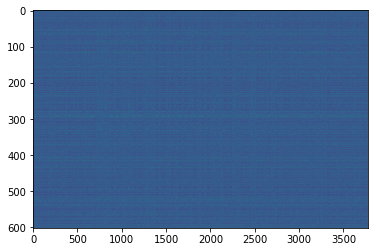

,AUC,pAUC
Source_0,0.325600,0.475263
Source_1,0.724500,0.618947
Source_2,0.747415,0.628014
Target_0,0.608900,0.488421
Target_1,0.490306,0.541676
Target_2,0.596982,0.582145
mean,0.582284,0.555744
h_mean,0.538290,0.549280


2021-05-30 23:06:25,944 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:481.822477, val_AUC_hmean:0.538290, val_pAUC_hmean:0.549280, best_flag:True
2021-05-30 23:06:25,945 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.53it/s]
2021-05-30 23:06:26,382 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.78it/s]
2021-05-30 23:06:26,420 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.97it/s]
2021-05-30 23:06:26,459 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:420.364970, val_AUC_hmean:0.598138, val_pAUC_hmean:0.544414, best_flag:False
2021-05-30 23:06:26,460 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.44it/s]
2021-05-30 23:06:26,899 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.31it/s]
2021-05-30 23:06:26,936 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.72it/s]


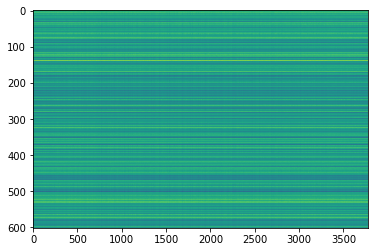

,AUC,pAUC
Source_0,0.692200,0.517368
Source_1,0.813200,0.594737
Source_2,0.689305,0.561873
Target_0,0.595900,0.563684
Target_1,0.627449,0.513104
Target_2,0.655421,0.591250
mean,0.678912,0.557003
h_mean,0.672439,0.555127


2021-05-30 23:06:28,370 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:384.982374, val_AUC_hmean:0.672439, val_pAUC_hmean:0.555127, best_flag:True
2021-05-30 23:06:28,371 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.21it/s]
2021-05-30 23:06:28,814 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.68it/s]
2021-05-30 23:06:28,852 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.35it/s]
2021-05-30 23:06:28,894 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:366.105883, val_AUC_hmean:0.666248, val_pAUC_hmean:0.550526, best_flag:False
2021-05-30 23:06:28,895 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 23:06:29,334 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.63it/s]
2021-05-30 23:06:29,372 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.65it/s]
2021-05-30 23:06

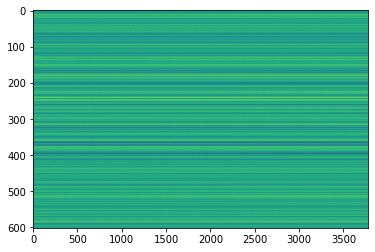

,AUC,pAUC
Source_0,0.774400,0.555263
Source_1,0.809200,0.606316
Source_2,0.755615,0.574069
Target_0,0.645300,0.577895
Target_1,0.599082,0.506337
Target_2,0.624760,0.536413
mean,0.701393,0.559382
h_mean,0.692038,0.557526


2021-05-30 23:06:32,926 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:319.538353, val_AUC_hmean:0.692038, val_pAUC_hmean:0.557526, best_flag:True
2021-05-30 23:06:32,926 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.58it/s]
2021-05-30 23:06:33,363 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.34it/s]
2021-05-30 23:06:33,440 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.88it/s]
2021-05-30 23:06:33,480 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:315.547684, val_AUC_hmean:0.651798, val_pAUC_hmean:0.546732, best_flag:False
2021-05-30 23:06:33,481 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.59it/s]
2021-05-30 23:06:33,917 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.81it/s]
2021-05-30 23:06:33,954 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.90it/s]


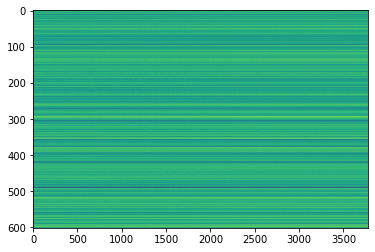

,AUC,pAUC
Source_0,0.760600,0.552632
Source_1,0.860600,0.672105
Source_2,0.766043,0.588141
Target_0,0.633900,0.561053
Target_1,0.658878,0.551987
Target_2,0.559496,0.524070
mean,0.706586,0.574998
h_mean,0.692462,0.571439


2021-05-30 23:06:35,396 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:309.965159, val_AUC_hmean:0.692462, val_pAUC_hmean:0.571439, best_flag:True
2021-05-30 23:06:35,397 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.24it/s]
2021-05-30 23:06:35,839 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.57it/s]
2021-05-30 23:06:35,877 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.20it/s]
2021-05-30 23:06:35,917 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:306.556979, val_AUC_hmean:0.644402, val_pAUC_hmean:0.538596, best_flag:False
2021-05-30 23:06:35,918 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.64it/s]
2021-05-30 23:06:36,355 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.35it/s]
2021-05-30 23:06:36,392 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.62it/s]
2021-05-30 23

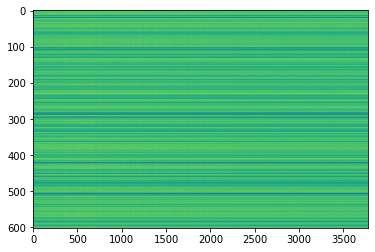

,AUC,pAUC
Source_0,0.783500,0.584737
Source_1,0.896900,0.677368
Source_2,0.757130,0.609250
Target_0,0.636300,0.552632
Target_1,0.687755,0.586681
Target_2,0.549789,0.517999
mean,0.718562,0.588111
h_mean,0.701219,0.584091


2021-05-30 23:06:44,744 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:265.028000, val_AUC_hmean:0.701219, val_pAUC_hmean:0.584091, best_flag:True
2021-05-30 23:06:44,744 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.51it/s]
2021-05-30 23:06:45,183 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.84it/s]
2021-05-30 23:06:45,221 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.24it/s]
2021-05-30 23:06:45,260 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:262.269135, val_AUC_hmean:0.687908, val_pAUC_hmean:0.568228, best_flag:False
2021-05-30 23:06:45,261 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 23:06:45,703 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.75it/s]
2021-05-30 23:06:45,741 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.12it/s]
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 97.83it/s]
2021-05-30 23:06:53,649 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.01it/s]
2021-05-30 23:06:53,688 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:232.246582, val_AUC_hmean:0.689110, val_pAUC_hmean:0.572479, best_flag:False
2021-05-30 23:06:53,690 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.27it/s]
2021-05-30 23:06:54,132 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.75it/s]
2021-05-30 23:06:54,170 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.78it/s]
2021-05-30 23:06:54,211 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:230.373505, val_AUC_hmean:0.665809, val_pAUC_hmean:0.563107, best_flag:False
2021-05-30 23:06:54,212 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.25it/s]
2021-05-30 23:06:54,654 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-05-30 23:07:02,059 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.12it/s]
2021-05-30 23:07:02,503 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.07it/s]
2021-05-30 23:07:02,542 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.05it/s]
2021-05-30 23:07:02,582 - pytorch_modeler.py - INFO - epoch:62/300, train_losses:205.553188, val_AUC_hmean:0.682252, val_pAUC_hmean:0.562088, best_flag:False
2021-05-30 23:07:02,583 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.19it/s]
2021-05-30 23:07:03,026 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.04it/s]
2021-05-30 23:07:03,065 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.78it/s]
2021-05-30 23:07:03,105 - pytorch_modeler.py - INFO - epoch:63/300, train_losses:204.857641, val_AUC_hmean:0.681768, val_pAUC_hmean:0.571383, best_flag:False
2021-05-30 23:

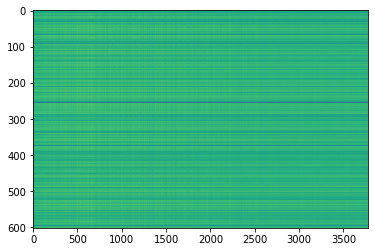

,AUC,pAUC
Source_0,0.769300,0.610000
Source_1,0.912800,0.692105
Source_2,0.779501,0.681021
Target_0,0.666300,0.565789
Target_1,0.665510,0.500322
Target_2,0.556421,0.519011
mean,0.724972,0.594708
h_mean,0.707637,0.585623


2021-05-30 23:07:08,161 - pytorch_modeler.py - INFO - epoch:70/300, train_losses:193.030645, val_AUC_hmean:0.707637, val_pAUC_hmean:0.585623, best_flag:True
2021-05-30 23:07:08,162 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.06it/s]
2021-05-30 23:07:08,707 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.84it/s]
2021-05-30 23:07:08,745 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.90it/s]
2021-05-30 23:07:08,785 - pytorch_modeler.py - INFO - epoch:71/300, train_losses:191.853814, val_AUC_hmean:0.699215, val_pAUC_hmean:0.579943, best_flag:False
2021-05-30 23:07:08,787 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 23:07:09,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.28it/s]
2021-05-30 23:07:09,267 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.27it/s]
2021-05-30 23:0

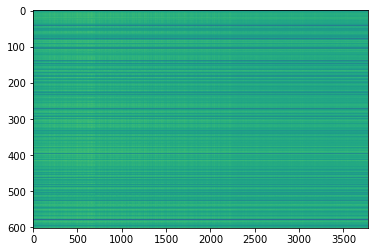

,AUC,pAUC
Source_0,0.806800,0.616316
Source_1,0.913800,0.691053
Source_2,0.780749,0.703068
Target_0,0.605100,0.537895
Target_1,0.654286,0.536950
Target_2,0.551999,0.523665
mean,0.718789,0.601491
h_mean,0.697089,0.592707


2021-05-30 23:07:12,269 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:186.589105, val_AUC_hmean:0.697089, val_pAUC_hmean:0.592707, best_flag:True
2021-05-30 23:07:12,270 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.34it/s]
2021-05-30 23:07:12,711 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.02it/s]
2021-05-30 23:07:12,749 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.96it/s]
2021-05-30 23:07:12,790 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:184.930113, val_AUC_hmean:0.684052, val_pAUC_hmean:0.561924, best_flag:False
2021-05-30 23:07:12,791 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.44it/s]
2021-05-30 23:07:13,229 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.12it/s]
2021-05-30 23:07:13,266 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.10it/s]
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 98.99it/s]
2021-05-30 23:07:21,058 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.73it/s]
2021-05-30 23:07:21,099 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:165.249084, val_AUC_hmean:0.686902, val_pAUC_hmean:0.581045, best_flag:False
2021-05-30 23:07:21,100 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.47it/s]
2021-05-30 23:07:21,538 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.14it/s]
2021-05-30 23:07:21,576 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.58it/s]
2021-05-30 23:07:21,623 - pytorch_modeler.py - INFO - epoch:93/300, train_losses:164.081099, val_AUC_hmean:0.704313, val_pAUC_hmean:0.589259, best_flag:False
2021-05-30 23:07:21,624 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.50it/s]
2021-05-30 23:07:22,079 - pytorch_modeler.py - INFO - valid_source
100%|█████████

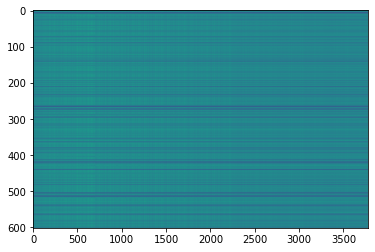

,AUC,pAUC
Source_0,0.791100,0.613158
Source_1,0.908100,0.701053
Source_2,0.796168,0.701191
Target_0,0.612500,0.564737
Target_1,0.668163,0.530505
Target_2,0.535852,0.509096
mean,0.718647,0.603290
h_mean,0.696317,0.593855


2021-05-30 23:07:25,656 - pytorch_modeler.py - INFO - epoch:98/300, train_losses:157.412683, val_AUC_hmean:0.696317, val_pAUC_hmean:0.593855, best_flag:True
2021-05-30 23:07:25,657 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.14it/s]
2021-05-30 23:07:26,201 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.05it/s]
2021-05-30 23:07:26,239 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.07it/s]
2021-05-30 23:07:26,278 - pytorch_modeler.py - INFO - epoch:99/300, train_losses:156.461461, val_AUC_hmean:0.684151, val_pAUC_hmean:0.570482, best_flag:False
2021-05-30 23:07:26,279 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.18it/s]
2021-05-30 23:07:26,723 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.76it/s]
2021-05-30 23:07:26,761 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.36it/s]
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 99.52it/s]
2021-05-30 23:07:34,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.92it/s]
2021-05-30 23:07:34,625 - pytorch_modeler.py - INFO - epoch:115/300, train_losses:138.434269, val_AUC_hmean:0.671953, val_pAUC_hmean:0.573226, best_flag:False
2021-05-30 23:07:34,626 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 23:07:35,067 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.46it/s]
2021-05-30 23:07:35,106 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.74it/s]
2021-05-30 23:07:35,145 - pytorch_modeler.py - INFO - epoch:116/300, train_losses:137.318751, val_AUC_hmean:0.675039, val_pAUC_hmean:0.571695, best_flag:False
2021-05-30 23:07:35,147 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.26it/s]
2021-05-30 23:07:35,589 - pytorch_modeler.py - INFO - valid_source
100%|████████

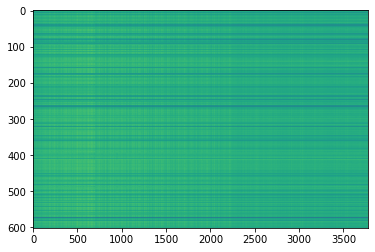

,AUC,pAUC
Source_0,0.807100,0.637368
Source_1,0.897700,0.715789
Source_2,0.789037,0.682428
Target_0,0.626700,0.566842
Target_1,0.669694,0.538346
Target_2,0.552576,0.503733
mean,0.723801,0.607418
h_mean,0.704315,0.597714


2021-05-30 23:07:37,122 - pytorch_modeler.py - INFO - epoch:117/300, train_losses:135.481125, val_AUC_hmean:0.704315, val_pAUC_hmean:0.597714, best_flag:True
2021-05-30 23:07:37,123 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.03it/s]
2021-05-30 23:07:37,568 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.96it/s]
2021-05-30 23:07:37,609 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.08it/s]
2021-05-30 23:07:37,649 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:134.929398, val_AUC_hmean:0.687471, val_pAUC_hmean:0.580523, best_flag:False
2021-05-30 23:07:37,650 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.06it/s]
2021-05-30 23:07:38,096 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.56it/s]
2021-05-30 23:07:38,133 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.95it/s]
2021-05-30 23

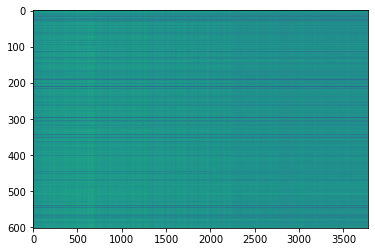

,AUC,pAUC
Source_0,0.809300,0.634211
Source_1,0.912300,0.721579
Source_2,0.754813,0.687588
Target_0,0.629300,0.563684
Target_1,0.651633,0.535446
Target_2,0.540177,0.508995
mean,0.716254,0.608584
h_mean,0.695127,0.598607


2021-05-30 23:07:40,189 - pytorch_modeler.py - INFO - epoch:120/300, train_losses:133.241492, val_AUC_hmean:0.695127, val_pAUC_hmean:0.598607, best_flag:True
2021-05-30 23:07:40,190 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.67it/s]
2021-05-30 23:07:40,642 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.53it/s]
2021-05-30 23:07:40,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.66it/s]
2021-05-30 23:07:40,721 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:132.331792, val_AUC_hmean:0.689057, val_pAUC_hmean:0.578297, best_flag:False
2021-05-30 23:07:40,722 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 23:07:41,160 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.71it/s]
2021-05-30 23:07:41,198 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.25it/s]
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 100.23it/s]
2021-05-30 23:07:49,118 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.48it/s]
2021-05-30 23:07:49,159 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:116.998271, val_AUC_hmean:0.690131, val_pAUC_hmean:0.583001, best_flag:False
2021-05-30 23:07:49,160 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.14it/s]
2021-05-30 23:07:49,604 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.03it/s]
2021-05-30 23:07:49,644 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.38it/s]
2021-05-30 23:07:49,685 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:115.435394, val_AUC_hmean:0.704231, val_pAUC_hmean:0.592498, best_flag:False
2021-05-30 23:07:49,686 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 23:07:50,127 - pytorch_modeler.py - INFO - valid_source
100%|██████

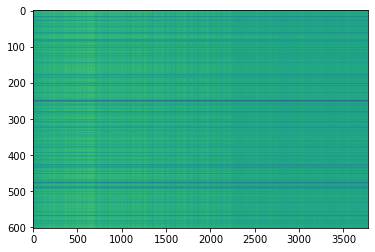

,AUC,pAUC
Source_0,0.793600,0.640000
Source_1,0.926300,0.745263
Source_2,0.808556,0.685712
Target_0,0.612200,0.561579
Target_1,0.656633,0.532653
Target_2,0.559689,0.523867
mean,0.726163,0.614846
h_mean,0.704267,0.604253


2021-05-30 23:07:52,660 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:112.782756, val_AUC_hmean:0.704267, val_pAUC_hmean:0.604253, best_flag:True
2021-05-30 23:07:52,661 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.58it/s]
2021-05-30 23:07:53,098 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.99it/s]
2021-05-30 23:07:53,135 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.58it/s]
2021-05-30 23:07:53,174 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:113.256262, val_AUC_hmean:0.670668, val_pAUC_hmean:0.580417, best_flag:False
2021-05-30 23:07:53,175 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.48it/s]
2021-05-30 23:07:53,614 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.46it/s]
2021-05-30 23:07:53,652 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.00it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 103.38it/s]
2021-05-30 23:08:01,556 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.92it/s]
2021-05-30 23:08:01,596 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:98.104827, val_AUC_hmean:0.681749, val_pAUC_hmean:0.579703, best_flag:False
2021-05-30 23:08:01,596 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.43it/s]
2021-05-30 23:08:02,035 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.72it/s]
2021-05-30 23:08:02,072 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.78it/s]
2021-05-30 23:08:02,112 - pytorch_modeler.py - INFO - epoch:159/300, train_losses:97.564427, val_AUC_hmean:0.682918, val_pAUC_hmean:0.592126, best_flag:False
2021-05-30 23:08:02,113 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.35it/s]
2021-05-30 23:08:02,553 - pytorch_modeler.py - INFO - valid_source
100%|███████

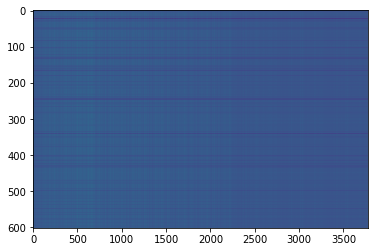

,AUC,pAUC
Source_0,0.807700,0.669474
Source_1,0.899400,0.715789
Source_2,0.788057,0.694624
Target_0,0.622000,0.530526
Target_1,0.675918,0.548228
Target_2,0.548635,0.536514
mean,0.723618,0.615859
h_mean,0.703501,0.605861


2021-05-30 23:08:07,761 - pytorch_modeler.py - INFO - epoch:167/300, train_losses:91.034938, val_AUC_hmean:0.703501, val_pAUC_hmean:0.605861, best_flag:True
2021-05-30 23:08:07,762 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.33it/s]
2021-05-30 23:08:08,238 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.18it/s]
2021-05-30 23:08:08,278 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.63it/s]
2021-05-30 23:08:08,320 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:90.900654, val_AUC_hmean:0.672723, val_pAUC_hmean:0.574511, best_flag:False
2021-05-30 23:08:08,321 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.67it/s]
2021-05-30 23:08:08,773 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.13it/s]
2021-05-30 23:08:08,810 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.58it/s]
2021-05-30 23:

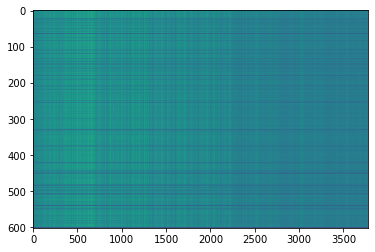

,AUC,pAUC
Source_0,0.809300,0.660526
Source_1,0.920200,0.745263
Source_2,0.784135,0.695093
Target_0,0.636900,0.562632
Target_1,0.668776,0.548550
Target_2,0.541715,0.527914
mean,0.726838,0.623330
h_mean,0.705135,0.612933


2021-05-30 23:08:10,807 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:89.317872, val_AUC_hmean:0.705135, val_pAUC_hmean:0.612933, best_flag:True
2021-05-30 23:08:10,808 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.35it/s]
2021-05-30 23:08:11,248 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.68it/s]
2021-05-30 23:08:11,287 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.60it/s]
2021-05-30 23:08:11,326 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:87.728778, val_AUC_hmean:0.691296, val_pAUC_hmean:0.591431, best_flag:False
2021-05-30 23:08:11,327 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.38it/s]
2021-05-30 23:08:11,767 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.11it/s]
2021-05-30 23:08:11,803 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.48it/s]
2021-05-30 23:

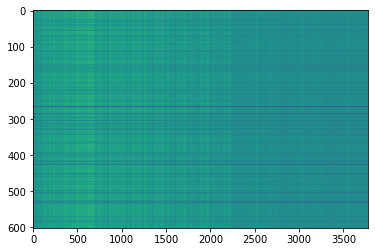

,AUC,pAUC
Source_0,0.794700,0.650000
Source_1,0.916700,0.725263
Source_2,0.796168,0.731682
Target_0,0.635700,0.541579
Target_1,0.669388,0.578410
Target_2,0.571799,0.562112
mean,0.730742,0.631508
h_mean,0.712499,0.622515


2021-05-30 23:08:14,951 - pytorch_modeler.py - INFO - epoch:175/300, train_losses:84.811281, val_AUC_hmean:0.712499, val_pAUC_hmean:0.622515, best_flag:True
2021-05-30 23:08:14,952 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.28it/s]
2021-05-30 23:08:15,395 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.98it/s]
2021-05-30 23:08:15,433 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.51it/s]
2021-05-30 23:08:15,472 - pytorch_modeler.py - INFO - epoch:176/300, train_losses:84.276571, val_AUC_hmean:0.686317, val_pAUC_hmean:0.597044, best_flag:False
2021-05-30 23:08:15,473 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.30it/s]
2021-05-30 23:08:15,915 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.99it/s]
2021-05-30 23:08:15,953 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.69it/s]
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 101.20it/s]
2021-05-30 23:08:23,801 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.33it/s]
2021-05-30 23:08:23,841 - pytorch_modeler.py - INFO - epoch:192/300, train_losses:73.166297, val_AUC_hmean:0.684958, val_pAUC_hmean:0.581774, best_flag:False
2021-05-30 23:08:23,842 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.31it/s]
2021-05-30 23:08:24,283 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.79it/s]
2021-05-30 23:08:24,321 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.61it/s]
2021-05-30 23:08:24,362 - pytorch_modeler.py - INFO - epoch:193/300, train_losses:72.223810, val_AUC_hmean:0.706899, val_pAUC_hmean:0.619536, best_flag:False
2021-05-30 23:08:24,363 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 23:08:24,803 - pytorch_modeler.py - INFO - valid_source
100%|████████

2021-05-30 23:08:32,300 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.29it/s]
2021-05-30 23:08:32,741 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.93it/s]
2021-05-30 23:08:32,779 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.69it/s]
2021-05-30 23:08:32,819 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:63.040310, val_AUC_hmean:0.698816, val_pAUC_hmean:0.593856, best_flag:False
2021-05-30 23:08:32,820 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.03it/s]
2021-05-30 23:08:33,266 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.48it/s]
2021-05-30 23:08:33,303 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.72it/s]
2021-05-30 23:08:33,343 - pytorch_modeler.py - INFO - epoch:210/300, train_losses:62.415852, val_AUC_hmean:0.691797, val_pAUC_hmean:0.594176, best_flag:False
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 103.77it/s]
2021-05-30 23:08:41,171 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:53.960472, val_AUC_hmean:0.687827, val_pAUC_hmean:0.593068, best_flag:False
2021-05-30 23:08:41,172 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.14it/s]
2021-05-30 23:08:41,616 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.61it/s]
2021-05-30 23:08:41,654 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.35it/s]
2021-05-30 23:08:41,695 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:54.397066, val_AUC_hmean:0.689849, val_pAUC_hmean:0.590832, best_flag:False
2021-05-30 23:08:41,696 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.29it/s]
2021-05-30 23:08:42,137 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.64it/s]
2021-05-30 23:08:42,175 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 27.18it/s]
2021-05-30 23:08:50,037 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.53it/s]
2021-05-30 23:08:50,076 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.96it/s]
2021-05-30 23:08:50,117 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:45.555750, val_AUC_hmean:0.698533, val_pAUC_hmean:0.595082, best_flag:False
2021-05-30 23:08:50,118 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.22it/s]
2021-05-30 23:08:50,560 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.03it/s]
2021-05-30 23:08:50,599 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.61it/s]
2021-05-30 23:08:50,642 - pytorch_modeler.py - INFO - epoch:243/300, train_losses:45.733876, val_AUC_hmean:0.691541, val_pAUC_hmean:0.593399, best_flag:False
2021-05-30 23:08:50,643 - pytorch_modeler.py - INFO - train
100%|█████████

2021-05-30 23:08:58,584 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.29it/s]
2021-05-30 23:08:59,025 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.15it/s]
2021-05-30 23:08:59,064 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.67it/s]
2021-05-30 23:08:59,104 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:38.418765, val_AUC_hmean:0.690402, val_pAUC_hmean:0.601181, best_flag:False
2021-05-30 23:08:59,105 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.28it/s]
2021-05-30 23:08:59,547 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.67it/s]
2021-05-30 23:08:59,584 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.01it/s]
2021-05-30 23:08:59,626 - pytorch_modeler.py - INFO - epoch:260/300, train_losses:38.234961, val_AUC_hmean:0.698633, val_pAUC_hmean:0.590004, best_flag:False
2021-05-30 23

100%|██████████| 2/2 [00:00<00:00, 105.42it/s]
2021-05-30 23:09:07,463 - pytorch_modeler.py - INFO - epoch:275/300, train_losses:32.964256, val_AUC_hmean:0.692192, val_pAUC_hmean:0.590850, best_flag:False
2021-05-30 23:09:07,464 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.28it/s]
2021-05-30 23:09:07,906 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.78it/s]
2021-05-30 23:09:07,944 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.68it/s]
2021-05-30 23:09:07,984 - pytorch_modeler.py - INFO - epoch:276/300, train_losses:32.008826, val_AUC_hmean:0.686493, val_pAUC_hmean:0.586008, best_flag:False
2021-05-30 23:09:07,984 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 23:09:08,425 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.35it/s]
2021-05-30 23:09:08,462 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 27.46it/s]
2021-05-30 23:09:16,332 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.60it/s]
2021-05-30 23:09:16,369 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.73it/s]
2021-05-30 23:09:16,409 - pytorch_modeler.py - INFO - epoch:292/300, train_losses:27.768920, val_AUC_hmean:0.682112, val_pAUC_hmean:0.578247, best_flag:False
2021-05-30 23:09:16,410 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 23:09:16,852 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.69it/s]
2021-05-30 23:09:16,889 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.53it/s]
2021-05-30 23:09:16,929 - pytorch_modeler.py - INFO - epoch:293/300, train_losses:27.093165, val_AUC_hmean:0.679721, val_pAUC_hmean:0.582867, best_flag:False
2021-05-30 23:09:16,930 - pytorch_modeler.py - INFO - train
100%|███████

,AUC,pAUC
Source_0,0.794700,0.650000
Source_1,0.916700,0.725263
Source_2,0.796168,0.731682
Target_0,0.635700,0.541579
Target_1,0.669388,0.578410
Target_2,0.571799,0.562112
mean,0.730742,0.631508
h_mean,0.712499,0.622515


elapsed time: 180.845649004 [sec]


In [16]:
for machine_type in machine_types:
    run(machine_type)